# **Information**

**Codes**

*Santiago Lamas Fresard*

## **Bibliography used**

1. Piazza, A. (2019). A discussion of vintage optimization models in Forest Economics. Forest Science, 66(4), 469–477. https://doi.org/10.1093/forsci/fxz056
2. Pukkala, T., Vauhkonen, J., Korhonen, K. T., & Packalen, T. (2021). Self-learning growth simulator for modelling forest stand dynamics in changing conditions. Forestry an International Journal of Forest Research, 94(3), 333–346. https://doi.org/10.1093/forestry/cpab008
3. Jenkins, J. C., Chojnacky, D. C., Heath, L. S., & Birdsey, R. A. (2003). National-Scale Biomass Estimators for United States Tree Species. Forest Science, 49(1), 12–35. https://doi.org/10.1093/forestscience/49.1.12

# **Inicialization**

Importing of useful libraries.

In [128]:
import Distributions
import Gurobi
import Ipopt
import JuMP
import LinearAlgebra
import Measures
import Plots
import Random
import Roots
import SDDP

using Distributions
using Gurobi
using Ipopt
using JuMP
using LinearAlgebra
using Measures
using Plots
using Printf
using Random
using Roots
using SDDP

const GRB_ENV = Gurobi.Env();

Set parameter Username
Set parameter LicenseID to value 2760931
Academic license - for non-commercial use only - expires 2027-01-05


# **Mitra & Wan's model**

The first part of the work was done on a single-species, multiaged forest model proposed by Mitra & Wan. For a reference on the model with a simpler notation, see Piazza (2019)

Given the gain function $u(c) = \frac{c^{1-\alpha}}{1-\alpha}$, we seek to find simpler estimates appropiate for the $\texttt{SDDP.jl}$ package.

For this, we approximate the set $\{(c,y): u(c)\leq y\}$ via an intersection of semiplanes, with each line separating the semiplanes a tangent to the set $\{(c,y): u(c) = y\}$. The collection of reference points to draw the lines, are chosen uniformly on the Y-axis. 

Thus, if there are $n$ semiplantes, the separating lines are of the form $\{c_t \mapsto a_i c_t + b_i\}_{i=1}^n$. When choosing the points $\{x_i\}_{i=1}^n$ on the x-axis, the coefficients $\{a_i\}_{i=1}^n$ and $\{b_i\}_{i=1}^n$ are defined as follows:

|  | Definition via tangent method |
|---|---|
| $a_i$ | $u'(x_i)$ |
| $b_i$ | $u(x_i) - a_i\cdot x_i$ |

An example of the lines obtained is shown.

In [129]:
# Parameters to use in the problem
α = 0.5 # risk aversion parameter for the utility function
UB = 500 # upper bound for the objective function

# Useful functions
obj = x -> x^(1-α)/(1-α) # objective function
deriv_obj = x -> x^-α # derivative of the objective function
inv_obj = y -> ((1-α)*y)^(1/(1-α)) # inverse of the objective function

# Parameters to estimate the objective function
T = inv_obj(UB)
ny = 200 # number of points for the discretization
dy = UB/ny # step sizes for the discretization

# Uniform discretization on the y-axis
d_unif_y = 1:dy:UB

# Preimage of the discretizations
f_inv_y = inv_obj.(d_unif_y) # uniform on y-axis

# Coefficients obtained
as = deriv_obj.(f_inv_y)              
bs = d_unif_y .- as .* f_inv_y;

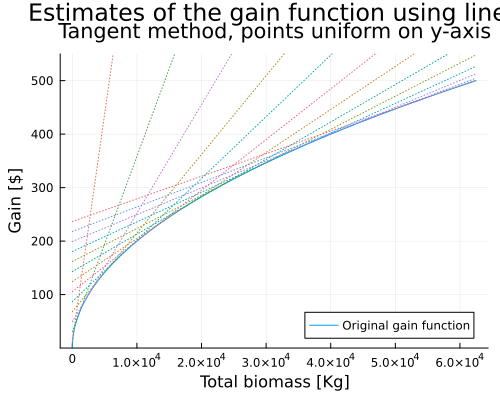

In [130]:
p = plot(
    obj, 
    0.1, 
    T, 
    ylims = (0.1,UB+50), 
    label = "Original gain function",
    xaxis = "Total biomass [Kg]",
    yaxis = "Gain [\$]", 
    title = "Tangent method, points uniform on y-axis"
    )
plot!([x -> as[i]*x + bs[i] for i in 10:15:ny], label=false, linestyle=:dot)
plot(p, 
    size = (500,400), 
    plot_title = "Estimates of the gain function using lines"
    )

## **Model testing**

We test the method previously defined on the Mitra & Wan's model.

In [131]:
UB = 5000 # upper bound for the objective function
b = 0.975 # discount factor used by Buongiorno
α = 0.5 # risk aversion parameter for the utility function
n = 5 # number of age classes
f = [0.8, 4.2, 16.99, 68.1, 84] # biomass coeffcients
x0 = [1.0, 0.0, 0.0, 0.0, 0.0] # initial state

# Cyclic graph consisting of one node with a probability of (1-b) of exiting the cycle 
graph = SDDP.UnicyclicGraph(b; num_nodes = 1)

# Number of training iterations for the models and number of simulations to compute the bounds
n_train_iterations = 50
n_simulations = 100;

In [ ]:
n_coefs = length(as)
model = SDDP.PolicyGraph(
    graph;
    sense = :Max,
    upper_bound = UB,
    # optimizer = Ipopt.Optimizer,
    optimizer = () -> Gurobi.Optimizer(GRB_ENV),
) do sp, t
    # variable: madera 
    @variable(sp, x[s = 1:n] >=0, SDDP.State, initial_value = x0[s]) # state variables, multidimensional.
    @variable(sp, c[1:n] >= 0) # control variables
    @variable(sp, TV >= 0) # Timber volume
    @variable(sp, u >= 0) # slack variable to maximize, forced to be approx. TV^(1-α)/(1-α) 
    @constraints(sp, begin
        c[n] == x[n].in # we harvest everything for the oldest age class
        [s = 1:n-1], x[s+1].out == x[s].in - c[s] # balance equations
        sum(f[s] * c[s] for s in 1:n) == TV # timber volume
        [s = 1:n], x[s].out <= 1 # state space constraints
        sum(x[s].out for s in 1:n) == 1 # x[1].out will be determined by this equation because the other x[s].out are determined by the balance equations
        [s = 1:n_coefs], u <= as[s]*TV + bs[s] #forces u to be approx. TV^(1-α)/(1-α)
    end)
    @stageobjective(sp, u)
end
SDDP.train(model, iteration_limit = n_train_iterations)
# Simulations to compute bounds. These will have different lengths.
simulations = SDDP.simulate(model, n_simulations, [:x])
objective_values = [
    sum(stage[:stage_objective] for stage in sim) for sim in simulations
]
μ, ci = round.(SDDP.confidence_interval(objective_values, 1.96); digits = 2)
upper_bound = SDDP.calculate_bound(model)
println("Confidence interval: ", μ, " ± ", ci)
println("Upper bound: ", round(upper_bound, digits = 2))

numerical stability report
  matrix range     [4e-03, 8e+01]
  objective range  [1e+00, 1e+00]
  bounds range     [5e+03, 5e+03]
  rhs range        [5e-01, 2e+02]
-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 5
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [18, 18]
  AffExpr in MOI.EqualTo{Float64}         : [7, 7]
  AffExpr in MOI.LessThan{Float64}        : [205, 205]
  VariableRef in MOI.GreaterThan{Float64} : [12, 12]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 8e+01]
  objective range  [1e+00, 1e+00]
  bounds range     [5e+03, 5e+03]
  r

# **Pukkala's model**

The following part of the work was done over a simplification done by Pukkala, Vauhkonen, Korhonen and Packalen. For more information, see Pukkala et al. (2021).

They proposed a model for forest evolution based on three sub-processes: diameter increment ($DI$), survival rates ($S$), and natural ingrowth ($NI$), all measured over five-year periods. Specifically, the functions they propose are of the following form:
- $DI(x) = \exp(f(x))$,
- $S(x) = \frac1{1+\exp(-g(x))}$,
- $NI(x) = \exp(h(x))$,
where the functions $f,\ g,\ h$ are affine functions of a state vector $x$, whose coefficients were subsequently estimated for each species.

We opted to implement an approximation of the Pukkala et al. model, thus studying centering on diameter classes with a range of 5 cm each, evolving every five years. The three previously mentioned functions presented highly complex state vectors, with variables such as temperature, soil quality, and the presence of peatlands. Given these, certain hypotheses were assumed to facilitate subsequent work:
- Mesophilic environment, that is, with moderate humidity and temperature conditions.
- Mineral soil with a high percentage of inorganic material (in contrast to, for example, peatlands).
- The sum of effective temperatures (sum of non-negative temperatures) was set at $TS = 1100$ degree days per year.
- Only one species was studied at a time.
- All trees in the same diameter class shared the same diameter, being equal to the average value.

Thus, the functions became the following:
- $f(x) = a_0 + a_1\sqrt{d} + a_2 d + a_3\log(BA+1) + a_4 \frac{BAL}{\sqrt{d+1}}+ a_5\log(TS)$.
- $g(x) = b_0 + b_1\sqrt{d} + b_2 d + b_3 \frac{BAL}{\sqrt{d+1}}$.
- $h(x) = c_0 + c_1\log(TS) + c_2\sqrt{BA}$.

Here, $BA$ stands as total basal area measured in $\text{m}^2$ per $\text{ha}$., while $BAL$ is the total basal area of trees larger than the one $f$ and $g$ are being applied to.

Using data from the Finnish National Forest Inventory (NFI), the authors determined the parameters for different species types through statistical adjustment based on basal area and the number of trees observed over a five-year period. Specifically, to determine the survival function $S$, *fixed-effects* and *mixed-effects* models were proposed, corresponding to those that assume independence between trees belonging to the same plots and those from different plots, respectively.

The main species used were *Picea abies*, *Pinus sylvestris*, and *Betula pendula*, corresponding to Norway spruce, Scots pine, and Silver birch, respectively. In addition, other broadleaf species were considered, such as *Betula pubescens*, *Populus tremula* and *Alnus incana*, scientific names for the downy birch, aspen and grey alder respectively.

As a first step to an implementation, some paremeters were fixed, as for example an initial condition to study.

In [133]:
num_classes = 8 # number of diameter classes to study
range_classes = 5 # range of each class
avg_diams = [range_classes*(k-1/2) for k in 1:num_classes] # average diameters of each class
BAs = [pi*d^2/40000 for d in avg_diams] # basal area per tree of each class
X0 = [500, 0, 0, 0, 0, 0, 0, 0]; # initial condition

## **Fixed basal areas**

### **Modeling**

A first implementation of the model followed certain sections of Pukkala et al.'s paper, assuming a constant basal area of ​​$BA = 25$ m² and a basal area for larger trees (than the one studied) of $BAL = 10$ m². Thus, all functions became single-variate, depending only on the diameter of the individual trees they were applied to.

First, a transition matrix between classes was implemented based on the diameter increment function $DI$, where for each class the fraction that remained within the same class after five years was calculated as:
$$
P_{i,i} = \frac{\text{Leb}(DI([5(i-1), 5i]) \cap [5(i-1), 5i])}{5},
$$
that is, the fraction of the interval associated with the class that remained in that interval after applying the $DI$ function ($\text{Leb}(\cdot)$ stands for the Lebesgue measure). Since this function was never greater than $5$, the remaining fraction moved to the next class.

In particular, a dictionary was created, where the transition matrix for each species was saved.

In [134]:
# Coefficients used for diameter increase
coefs_diam_pine = [-7.1552, 0.4415, -0.0685, -0.2027, -0.1236, 1.1198]
coefs_diam_spruce = [-12.7527, 0.1693, -0.0301, -0.1875, -0.0563, 1.9747]
coefs_diam_broadleaf = [-8.6306, 0.5097, -0.0829, -0.3864, -0.0545,  1.3163]

"""
     diam_fn(d:Float64, coefs:Vector{Float64})-> Float64

Returns DI(d) = exp(f(d)), based on the coefficients.

# Arguments
- `d::Float64`: diameter of the tree the function DI is being applied to.
- `coefs::Vector{Float64}`: coefficients of the function f.
"""
diam_fn = (d, coefs) -> exp(sum(coefs.*[1, sqrt(d), d, log(25+1), 10/sqrt(d+1), log(1100)]))

"""
     tr_diam(fn:Function)-> Matrix{Float64}

Returns the transition matrix P, taking DI = fn.

# Arguments
- `fn:Function`: Diameter-increase function.
"""
function tr_diam(fn)
    tr = zeros(num_classes,num_classes)
    for i in 1:num_classes-1
        # The help function gives the increased diameter for each class, minus the maximum diamter 
        # of said class. Thus, its unique zero (TBP) is the diameter in the class that reaches exactly
        # that maximum diameter. In consequence, all diameters before it remain in the class.
        help = d -> d + fn(d) - range_classes*i
        crit = find_zero(help, range_classes*i)
        frac = (crit - range_classes*(i-1))/range_classes
        tr[i,i] = frac
        tr[i+1,i] = 1 - frac
    end
    # It's asummed that all trees on the larger class remain there.
    tr[end,end] = 1
    return tr
end

# Transition matrices for each species
diam = Dict()
diam["Pine"] = tr_diam(d -> diam_fn(d, coefs_diam_pine))
diam["Spruce"] = tr_diam(d -> diam_fn(d, coefs_diam_spruce))
diam["Birch"] = tr_diam(d -> diam_fn(d, coefs_diam_broadleaf))
diam["Other broadleaf species"] = tr_diam(d -> diam_fn(d, coefs_diam_broadleaf));

Even though the function `tr_diam` could take as input only the coefficients, this definition will become useful in later modifications of the model.

On the other hand, a survival rate was associated with each diameter class, corresponding to evaluating the survival function $S$ at the average value of the interval associated with that class. As on the previous case, a dictionary is created to save the survival rates of each species and effects model.

In [135]:
# Coefficients used for survival
coefs_survival_pine_mixed = [4.1505, 3.1513, -0.3575, -0.4001]
coefs_survival_spruce_mixed = [9.6649, 1.0157, -0.1577, -0.3244]
coefs_survival_broadleaf_mixed = [3.6655, 1.0650, -0.1509, -0.0326]
coefs_survival_pine_fixed = [1.41223, 1.8852, -0.21317, -0.25637]
coefs_survival_spruce_fixed = [5.01677, 0.36902, -0.07504, -0.2319]
coefs_survival_broadleaf_fixed = [1.60895, 0.71578, -0.08236, -0.13481]

"""
     surviv_fn(d:Float64, coefs:Vector{Float64})-> Float64

Returns S(d) = 1/(1+exp(-g(d)), based on the coefficients.

# Arguments
- `d::Float64`: diameter of the tree the function S is being applied to.
- `coefs::Vector{Float64}`: coefficients of the function g.
"""
surviv_fn = (d, coefs) -> 1/( 1+exp( -sum( coefs.*[1, sqrt(d), d, 10/sqrt(d+1)] ) ) )

"""
     survival_eval(coefs:Vector{Float64})-> Vector{Float64}

Returns the survival rates assigned to each class based on the coefficents.

# Arguments
- `coefs::Vector{Float64}`: coefficients of the function g.
"""
survival_eval = coefs -> [ surviv_fn(d, coefs) for d in avg_diams ]

# Survival rates for each species and each effects model.
surviv = Dict()
surviv["Pine", "fixed"] = survival_eval(coefs_survival_pine_fixed)
surviv["Spruce", "fixed"] = survival_eval(coefs_survival_spruce_fixed)
surviv["Birch", "fixed"] = survival_eval(coefs_survival_broadleaf_fixed)
surviv["Other broadleaf species", "fixed"] = survival_eval(coefs_survival_broadleaf_fixed)
surviv["Pine", "mixed"] = survival_eval(coefs_survival_pine_mixed)
surviv["Spruce", "mixed"] = survival_eval(coefs_survival_spruce_mixed)
surviv["Birch", "mixed"] = survival_eval(coefs_survival_broadleaf_mixed)
surviv["Other broadleaf species", "mixed"] = survival_eval(coefs_survival_broadleaf_mixed);

Finally ingrowth, understood as natural regeneration, was kept constant since the regeneration function $NI$ depends exclusively on the total basal area.

In [136]:
# Coefficients used for ingrowth
coefs_ingrowth_pine = [-6.6933, 1.9051, -0.5035]
coefs_ingrowth_spruce = [-9.6128, 2.2897, -0.8739]
coefs_ingrowth_birch = [-3.2919, 1.5438, -1.2920]
coefs_ingrowth_broadleaf = [-48.4331,  7.6107, -0.2227]

"""
     ingrowth_fn(d:Float64, coefs:Vector{Float64})-> Float64

Returns NI(d) = exp(h(d)), based on the coefficients.

# Arguments
- `d::Float64`: diameter of the tree the function NI is being applied to.
- `coefs::Vector{Float64}`: coefficients of the function h.
"""
ingrowth_fn = (d, coefs) -> exp(sum(coefs.*[1, log(1100), sqrt(25)]))

# Ingrowth functions for each species.
ingrowth = Dict()
ingrowth["Pine"] = d-> ingrowth_fn(d,coefs_ingrowth_pine)
ingrowth["Spruce"] = d-> ingrowth_fn(d,coefs_ingrowth_spruce)
ingrowth["Birch"] = d-> ingrowth_fn(d,coefs_ingrowth_birch)
ingrowth["Other broadleaf species"] = d-> ingrowth_fn(d,coefs_ingrowth_broadleaf);

To show how these functions behave, they are plotted.

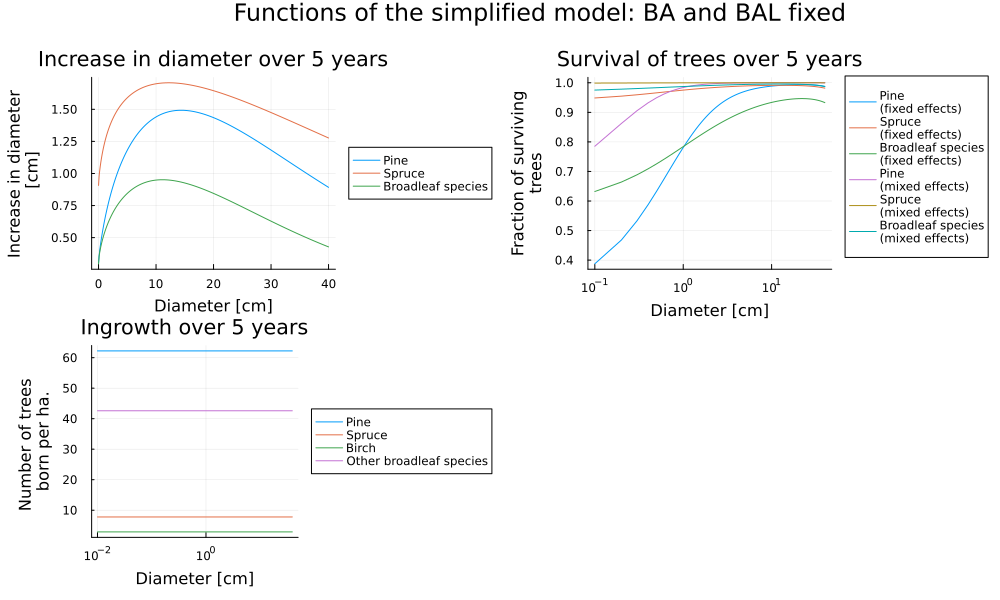

In [137]:
x1 = 0:0.1:num_classes*range_classes
p1 = plot(
    x1, 
    [d -> diam_fn(d, coefs_diam_pine),
    d -> diam_fn(d, coefs_diam_spruce),
    d -> diam_fn(d, coefs_diam_broadleaf)], 
    xlabel="Diameter [cm]", 
    ylabel="Increase in diameter\n [cm]", 
    left_margin=5mm,
    title="Increase in diameter over 5 years", 
    label=["Pine" "Spruce" "Broadleaf species"], 
    legend=:outerright
    )

x2 = 0.1:0.1:num_classes*range_classes
p2 = plot(
    x2, 
    [d -> surviv_fn(d,coefs_survival_pine_fixed), 
    d -> surviv_fn(d, coefs_survival_spruce_fixed), 
    d -> surviv_fn(d, coefs_survival_broadleaf_fixed), 
    d -> surviv_fn(d, coefs_survival_pine_mixed), 
    d -> surviv_fn(d, coefs_survival_spruce_mixed), 
    d -> surviv_fn(d, coefs_survival_broadleaf_mixed)], 
    xaxis=:log10, 
    xlabel="Diameter [cm]", 
    ylabel="Fraction of surviving\ntrees",
    left_margin=5mm,
    title="Survival of trees over 5 years",
    label=["Pine\n(fixed effects)" "Spruce\n(fixed effects)" "Broadleaf species\n(fixed effects)" "Pine\n(mixed effects)" "Spruce\n(mixed effects)" "Broadleaf species\n(mixed effects)"],
    legend=:outerright
    )

x3 = 0.01:1:num_classes*range_classes
p3 = plot(
    x3, 
    [ingrowth["Pine"], 
    ingrowth["Spruce"], 
    ingrowth["Birch"], 
    ingrowth["Other broadleaf species"]],
    xaxis=:log10, 
    xlabel="Diameter [cm]", 
    ylabel="Number of trees \nborn per ha.",
    bottom_margin=5mm, 
    title="Ingrowth over 5 years", 
    label=["Pine" "Spruce" "Birch" "Other broadleaf species"], 
    legend=:outerright
    )
plot(
    p1, p2, p3, 
    layout=(2,2), 
    size=(1000,600), 
    plot_title="Functions of the simplified model: BA and BAL fixed", 
    plot_titlevspan=0.08
    )

### **Simulations**

With the model defined, simulations where ran. Thus, every five years, the state vector had the survival rates applied to each class, after which they evolved according to the transition matrix, adding a number of trees to the first class given by the ingrowth function.

With this end, three functions were created with the purpose of running and plotting the simulations.

In [138]:
"""
     indiv_tray(num_steps:Int64, initial_config:Vector{Float64}, 
     diam_matrix:Matrix{Float64}, surv_rates:Vector{Float64}, 
     ingrowth_eval:Function)->Matrix{Float64}

Returns a simulation of the model according to the given arguments.

# Arguments
- `num_steps:Int64`: number of steps the simulation takes.
- `initial_config:Vector{Float64}`: initial configuration of the forest.
- `diam_matrix:Matrix{Float64}`: transition matrix for the diameter classes
- `surv_rates:Vector{Float64}`: survival rates for each diameter class.
- `ingrowth_eval:Function`: ingrowth function.
"""
function indiv_tray(num_steps, initial_config, diam_matrix, surv_rates, ingrowth_eval)
    X = Array{Float64}(undef, num_steps, num_classes)
    X[1,:] = initial_config
    for i in 2:num_steps
        X[i,:] = diam_matrix * (X[i-1,:] .* surv_rates)
        X[i,1] += ingrowth_eval(0)
    end
    return X
end;

In [139]:
# Legends for plotting
legends_pie = ["[0,5] cm", "[5,10] cm", "[10,15] cm", "[15,20] cm", "[20,25] cm", "[25,30] cm",
     "[30,35] cm", "[35,40] cm", "[40,45] cm", "[45,50] cm"]

"""
     create_pie(data:Vector{Float64}, effects:String)

Returns a pie chart of the data with a title that states the effects model.

# Arguments
- `data:Vector{Float64}`: data plotted on the pie chart.
- `effects:String`: effects model to be shown on the title.
"""
function create_pie(data, effects)
    pie_chart = pie(
        legends_pie, 
        data, 
        title = "Final distribution ("*effects*" effects)", 
        l = 0.5, 
        legend = :outerright
        )
    datapct = [@sprintf("%.1f%%", x/sum(data)*100) for x in data]
    θ = (cumsum(data) - data/2) .* 360/sum(data)
    scθ = sincosd.(θ)
    for (s, sci) in zip(datapct, scθ)
        annotate!(1.4*sci[2], 1.4*sci[1], text(s, 6, :black))
    end
    return pie_chart
end;

In [140]:
# Legends for plotting
legends = ["[0,5] cm" "[5,10] cm" "[10,15] cm" "[15,20] cm" "[20,25] cm" "[25,30] cm" "[30,35] cm" "[35,40] cm" "[40,45] cm" "[45,50] cm"]

"""
     simulate_and_plot(species:String, num_steps:Int64, initial_config:Vector{Float64})

Simulates the model for the chosen species both on the fixed-effects and mixed-effects cases,
plotting both the evolution of the distribution on diameter classes and a pie chart with the
final distribution.

# Arguments
- `species:String`: species modeled.
- `num_steps:Int64`: number of steps the simulation is ran, each one corresponding to five years.
- `initial_config:Vector{Float64}`: initial configuration of the diameter classes.  
"""
function simulate_and_plot(species, num_steps, initial_config)
    # Both effects models are ran using the transition matrix, survival rates and ingrowth function of the species.
    X_fixed = indiv_tray(
        num_steps+1, 
        initial_config, 
        diam[species], 
        surviv[species, "fixed"], 
        ingrowth[species]
        )
    X_mixed = indiv_tray(
        num_steps+1, 
        initial_config, 
        diam[species], 
        surviv[species, "mixed"], 
        ingrowth[species]
        )
    # Evolution of the number of trees
    print("Initial size of the forest: ");println(sum(X_fixed[1,:]))
    print("Final size of the forest (fixed effects): ");println(sum(X_fixed[end,:]))
    print("Final size of the forest (mixed effects): ");println(sum(X_mixed[end,:]))
    pf1 = plot(
        0:5:num_steps*5, 
        X_fixed .+ 1, 
        yaxis=:log10, 
        label = legends, 
        legend = :outerright,
        title = "Evolution (fixed effects)", 
        left_margin=5mm,
        xlabel = "Time [years]", 
        ylabel = "Number of trees + 1"
        )
    pf2 = create_pie(
        X_fixed[end,:], 
        "fixed"
        )
    pm1 = plot(
        0:5:num_steps*5, 
        X_mixed .+ 1, 
        yaxis=:log10, 
        label = legends, 
        legend = :outerright,
        title = "Evolution (mixed effects)", 
        xlabel = "Time [years]", 
        ylabel = "Number of trees + 1"
        )
    pm2 = create_pie(
        X_mixed[end,:], 
        "mixed"
        )
    plot(
        pf1, pm1, pf2, pm2, 
        layout=(2,2), 
        size=(800,700), 
        plot_title=species*"'s models"
        )
end;

#### **Pine**

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 3165.3871112507204
Final size of the forest (mixed effects): 6631.363032378051


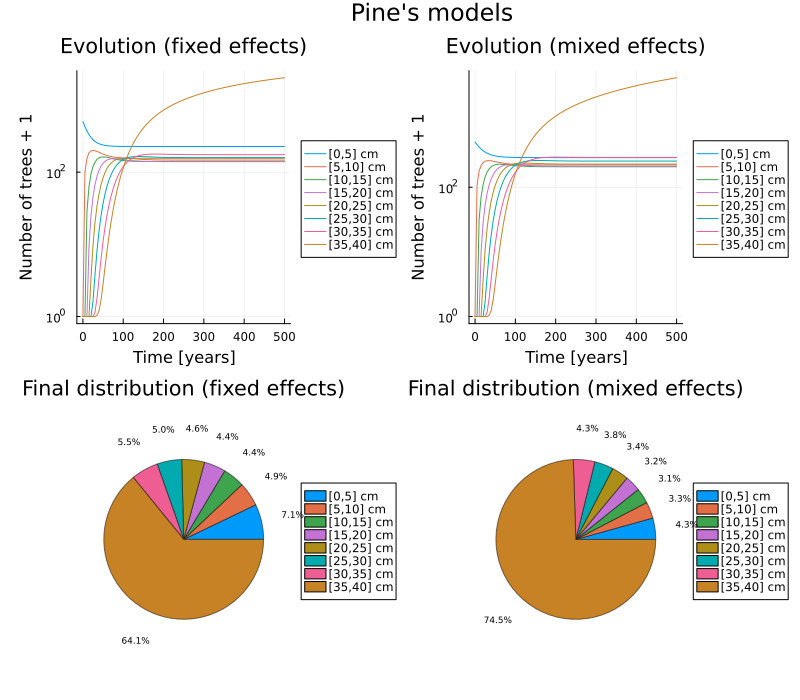

In [141]:
simulate_and_plot("Pine",100,X0)

#### **Spruce**

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 527.9385329263104
Final size of the forest (mixed effects): 1272.6172352862181


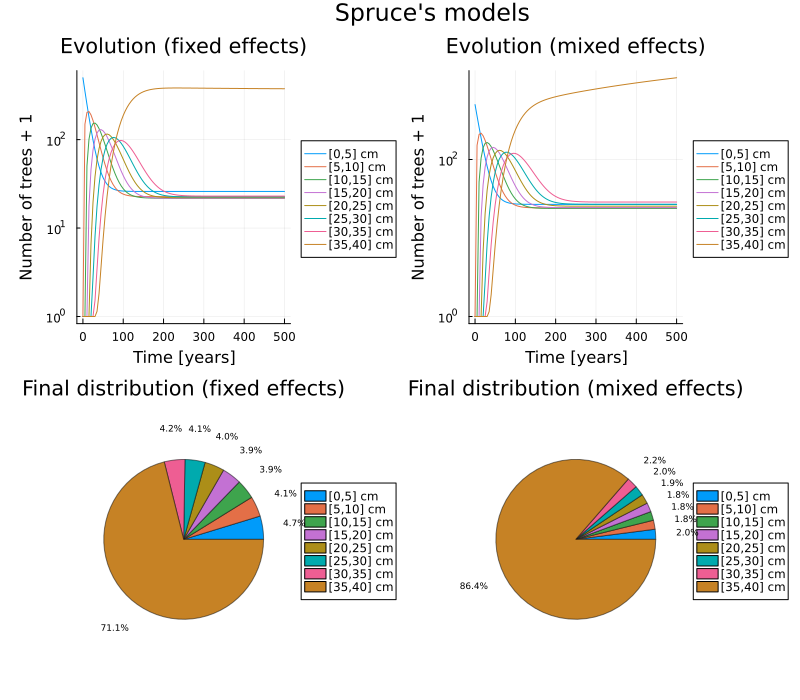

In [142]:
simulate_and_plot("Spruce",100,X0)

#### **Birch**

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 33.811034737798586
Final size of the forest (mixed effects): 408.829902628345


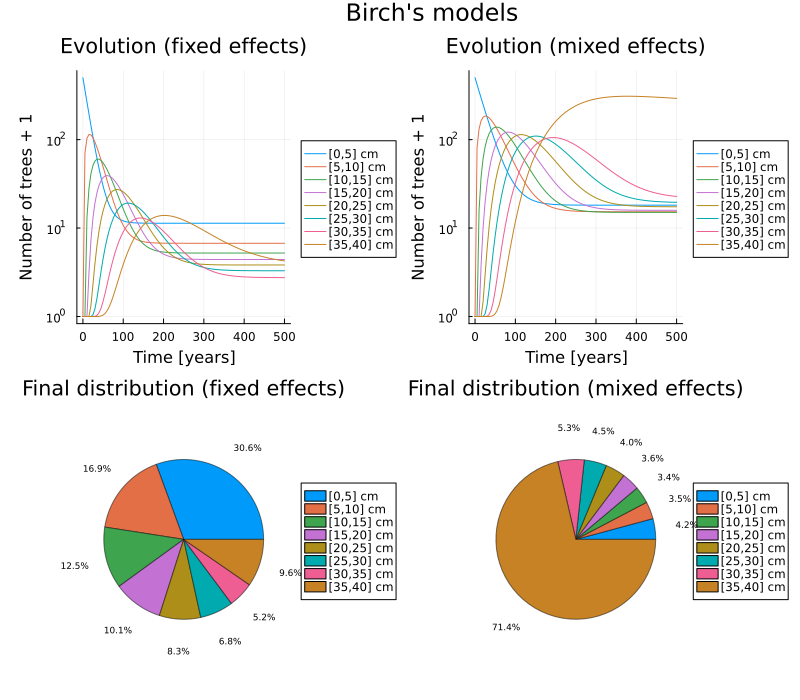

In [143]:
simulate_and_plot("Birch",100,X0)

#### **Other broadleaf species**

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 491.6717196201602
Final size of the forest (mixed effects): 3213.680345817256


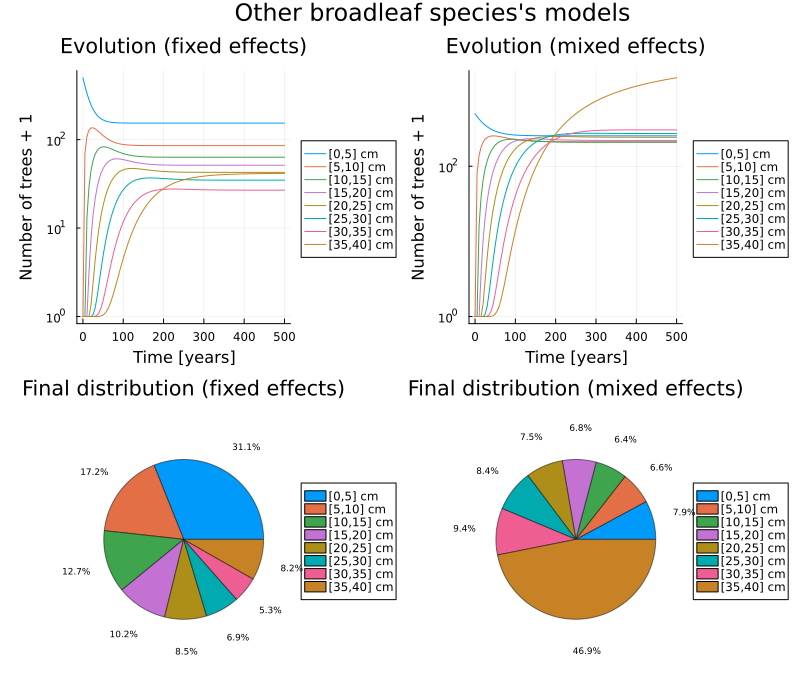

In [144]:
simulate_and_plot("Other broadleaf species",100,X0)

## **Non-fixed basal areas**

### **Modeling**

The second implementation of the model discarded the assumptions of constant ​$BA$ and $BAL$. In particular, due to the previous set of hypotheses, for a tree in a given class, $BAL$ was given by the basal area of all superior classes.

Thus, all previously defined functions had to account for this addition. This implied that the transition matrices and survival rates were dependent on the whole state of the forest.

In [145]:
"""
     vars_diam_BA(d:Float64, X:Vector{Float64})->Vector{Float64}

Returns the set of variables of the diameter increase function f, particularly depending
on the diameter of the studied tree and the whole forest.

# Arguments
- `d::Float64`: diameter of the tree the function DI is being applied to.
- `X::Vector{Float64}`: vector state of the current forest.
"""
function vars_diam_BA(d, X)
    help_BAL = zeros(num_classes)
    BA = sum(BAs.*X)
    num = floor(Int, d/5) + 1
    help_BAL[num:num_classes] .= 1
    BAL = sum(BAs.*X.*help_BAL)
    return [1, sqrt(d), d, log(BA+1), BAL/sqrt(d+1), log(1100)]
end

"""
     diameter_BA(d:Float64, X:Vector{Float64}, coefs:Vector{Float64})-> Matrix{Float64}

Returns the transition matrix P, taking DI = fn.

# Arguments
- `d::Float64`: diameter of the tree the function DI is being applied to.
- `X::Vector{Float64}`: vector state of the current forest.
- `coefs::Vector{Float64}`: coefficients of the diameter increase function f.
"""
diameter_BA = (d, X, coefs) -> exp(sum(coefs.*vars_diam_BA(d,X)))

# Transition matrix functions for each species based on the state of the forest.
diam_BA = Dict()
diam_BA["Pine"] = X -> tr_diam(d -> diameter_BA(d, X, coefs_diam_pine))
diam_BA["Spruce"] = X -> tr_diam(d -> diameter_BA(d, X, coefs_diam_spruce))
diam_BA["Birch"] = X -> tr_diam(d -> diameter_BA(d, X, coefs_diam_broadleaf))
diam_BA["Other broadleaf species"] = X -> tr_diam(d -> diameter_BA(d, X, coefs_diam_broadleaf));

In [146]:
"""
     vars_survival_BA(d:Float64, X:Vector{Float64})->Vector{Float64}

Returns the set of variables of the survival function g, particularly depending
on the diameter of the studied tree and the whole forest.

# Arguments
- `d::Float64`: diameter of the tree the function DI is being applied to.
- `X::Vector{Float64}`: vector state of the current forest.
"""
function vars_survival_BA(d, X)
    help_BAL = zeros(num_classes)
    num = floor(Int, d/5) + 1
    help_BAL[num:num_classes] .= 1
    BAL = sum(BAs.*X.*help_BAL)
    return [1, sqrt(d), d, BAL/sqrt(d+1)]    
end

"""
     survival_BA(X:Vector{Float64}, coefs:Vector{Float64})-> Vector{Float64}

Returns the survival rates assigned to each class based on the current state of the forest
and the coefficents.

# Arguments
- `X::Vector{Float64}`: vector state of the current forest.
- `coefs::Vector{Float64}`: coefficients of the survival function g.
"""
survival_BA = (X, coefs) -> [1/(1+exp(-sum(coefs.*vars_survival_BA(d, X)))) for d in avg_diams]

# Survival rates functions for each species and effects model based on the state of the forest.
surviv_BA = Dict()
surviv_BA["Pine", "fixed"] = X -> survival_BA(X, coefs_survival_pine_fixed)
surviv_BA["Spruce", "fixed"] = X -> survival_BA(X, coefs_survival_spruce_fixed)
surviv_BA["Birch", "fixed"] = X -> survival_BA(X, coefs_survival_broadleaf_fixed)
surviv_BA["Other broadleaf species", "fixed"] = X -> survival_BA(X, coefs_survival_broadleaf_fixed)
surviv_BA["Pine", "mixed"] = X -> survival_BA(X, coefs_survival_pine_mixed)
surviv_BA["Spruce", "mixed"] = X -> survival_BA(X, coefs_survival_spruce_mixed)
surviv_BA["Birch", "mixed"] = X -> survival_BA(X, coefs_survival_broadleaf_mixed)
surviv_BA["Other broadleaf species", "mixed"] = X -> survival_BA(X, coefs_survival_broadleaf_mixed);

In [147]:
"""
     vars_ingrowth_BA(X:Vector{Float64})->Vector{Float64}

Returns the set of variables of the function h, particularly depending
on the whole forest.

# Arguments
- `X::Vector{Float64}`: vector state of the current forest.
"""
vars_ingrowth_BA = X -> [1, log(1100), sqrt(sum(BAs.*X))]  

"""
     ingrowth_BA_coefs(X:Vector{Float64}, coefs:Vector{Float64})-> Float64

Returns the number of ingrown trees based on the current state of the forest and the coefficents.

# Arguments
- `X::Vector{Float64}`: vector state of the current forest.
- `coefs::Vector{Float64}`: coefficients of the ingrowth function h.
"""
ingrowth_BA_coefs = (X, coefs) -> exp(sum(coefs.*vars_ingrowth_BA(X)))

# Ingrowth for each species and effects model based on the state of the forest.
ingrowth_BA = Dict()
ingrowth_BA["Pine"] = X -> ingrowth_BA_coefs(X, coefs_ingrowth_pine)
ingrowth_BA["Spruce"] = X -> ingrowth_BA_coefs(X, coefs_ingrowth_spruce)
ingrowth_BA["Birch"] = X -> ingrowth_BA_coefs(X, coefs_ingrowth_broadleaf)
ingrowth_BA["Other broadleaf species"] = X -> ingrowth_BA_coefs(X, coefs_ingrowth_broadleaf);

As the ingrowth function depends explicitly on the basal area $BA$, we plot then to check for it's behaviour, also givin linear approximations for them.

In [148]:
"""
     vars_ingrowth_BA_fn(BA:Float64)->Vector{Float64}

Returns the set of variables of the function h, depending on the total basal area.

# Arguments
- `BA::Float64`: total basal area of the forest.
"""
vars_ingrowth_BA_fn = BA -> [1, log(1100), sqrt(BA)]  

"""
     ingrowth_BA_fn(BA:Float64)-> Float64

Returns the number of ingrown trees based on the total basal area and the coefficients.

# Arguments
- `BA::Float64`: total basal area of the forest.
- `coefs::Vector{Float64}`: coefficients of the ingrowth function h.
"""
ingrowth_BA_fn = (BA, coefs) -> exp(sum(coefs.*vars_ingrowth_BA_fn(BA)))

"""
     ingrowth_aprox(BA:Float64, x1:Float64, x2:Float64, coefs_ingrowth:Vector{Float64}))-> Float64

Approximates the ingrowth function with a linear function depending on the basal area and the coefficientes
obtained from interpolating between two chosen points.

# Arguments
- `BA::Float64`: total basal area of the forest.
- `x1::Float64`: first point used for the linear interpolation.
- `x2::Float64`: first point used for the linear interpolation.
- `coefs::Vector{Float64}`: coefficients of the ingrowth function h.
"""
function ingrowth_aprox(BA, x1, x2, coefs_ingrowth)
    y1, y2 = ingrowth_BA_fn(x1,coefs_ingrowth), ingrowth_BA_fn(x2,coefs_ingrowth)
    return (y2-y1)*(BA-x1)/(x2-x1) + y1
end

# Interpolation points for the different species.
x1_pine, x2_pine = 5, 65
x1_spruce, x2_spruce = 5, 45
x1_birch, x2_birch = 5, 45
x1_broadleaf, x2_broadleaf = 5, 45

# Approximated ingrowth for each species and effects model based on the state of the forest.
ingrowth_BA_aprox = Dict()
ingrowth_BA_aprox["Pine"] = BA -> ingrowth_aprox(BA, x1_pine, x2_pine, coefs_ingrowth_pine)
ingrowth_BA_aprox["Spruce"] = BA -> ingrowth_aprox(BA, x1_spruce, x2_spruce, coefs_ingrowth_spruce)
ingrowth_BA_aprox["Birch"] = BA -> ingrowth_aprox(BA, x1_birch, x2_birch, coefs_ingrowth_birch)
ingrowth_BA_aprox["Other broadleaf species"] = BA -> ingrowth_aprox(BA, x1_broadleaf, x2_broadleaf, coefs_ingrowth_broadleaf);

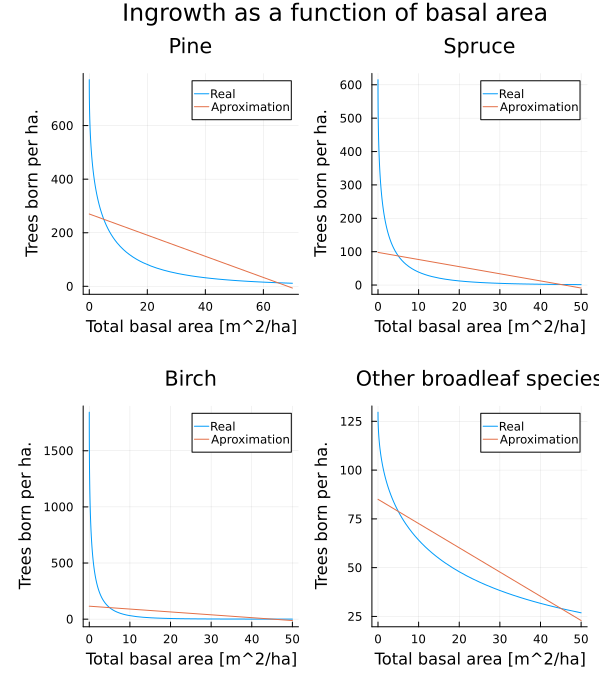

In [149]:
# Plots for all ingrowth functions, real and approximations.
p1 = plot(
    [BA -> ingrowth_BA_fn(BA,coefs_ingrowth_pine), 
    ingrowth_BA_aprox["Pine"]], 
    0, 
    x2_pine + 5, 
    xlabel="Total basal area [m^2/ha]", 
    ylabel="Trees born per ha.",
    title="Pine", 
    label=["Real" "Aproximation"],
    left_margin=5mm, bottom_margin=5mm
    )
p2 = plot(
    [BA -> ingrowth_BA_fn(BA,coefs_ingrowth_spruce), 
    ingrowth_BA_aprox["Spruce"]], 
    0, 
    x2_spruce + 5,
    xlabel="Total basal area [m^2/ha]", 
    ylabel="Trees born per ha.",
    title="Spruce", 
    label=["Real" "Aproximation"],
    bottom_margin=5mm
    )
p3 = plot(
    [BA -> ingrowth_BA_fn(BA,coefs_ingrowth_birch), 
    ingrowth_BA_aprox["Birch"]], 
    0, 
    x2_birch + 5,
    xlabel="Total basal area [m^2/ha]", 
    ylabel="Trees born per ha.",
    title="Birch", 
    label=["Real" "Aproximation"],
    left_margin=5mm, bottom_margin=5mm
    )
p4 = plot(
    [BA -> ingrowth_BA_fn(BA,coefs_ingrowth_broadleaf), 
    ingrowth_BA_aprox["Other broadleaf species"]], 
    0, 
    x2_broadleaf + 5,
    xlabel="Total basal area [m^2/ha]", 
    ylabel="Trees born per ha.",
    title="Other broadleaf species", 
    label=["Real" "Aproximation"],
    bottom_margin=5mm
    )
    
plot(
    p1, p2, p3, p4, 
    layout=(2,2), 
    size=(600,700), 
    plot_title="Ingrowth as a function of basal area"
    )

### **Simulations**

As in the previous case, the new model is simulated and plotted for each species.

In [150]:
"""
     traj_BA(num_steps:Int64, initial_config:Vector{Float64}, 
     diam_matrix:Matrix{Float64}, surviv:Vector{Float64}, 
     ingrowth:Function)->Matrix{Float64}

Returns a simulation of the basal-area-dependent model according to the given arguments.

# Arguments
- `num_steps:Int64`: number of steps the simulation takes.
- `initial_config:Vector{Float64}`: initial configuration of the forest.
- `diam_matrix:Function`: function giving the transition matrix for the diameter classes
- `surviv:Function`: function returning survival rates for each diameter class.
- `ingrowth:Function`: ingrowth function.
"""
function traj_BA(num_steps, initial_config, diam_matrix, surviv, ingrowth)
    X = Array{Float64}(undef, num_steps, num_classes)
    X[1,:] = initial_config
    for i in 2:num_steps
        Z = X[i-1,:]
        X[i,:] = diam_matrix(X[i-1,:] .* surviv(Z)) * X[i-1,:]
        X[i,1] += ingrowth(Z)
    end
    return X
end;

In [151]:
"""
     simulate_and_plot_BA(species:String, num_steps:Int64, initial_config:Vector{Float64})

Simulates the base-dependent model for the chosen species both on the fixed-effects and 
mixed-effects cases, plotting both the evolution of the distribution on diameter classes 
and a pie chart with the final distribution.

# Arguments
- `species:String`: species modeled.
- `num_steps:Int64`: number of steps the simulation is ran, each one corresponding to five years.
- `initial_config:Vector{Float64}`: initial configuration of the diameter classes.  
"""
function simulate_and_plot_BA(species, num_steps, initial_config)
    X_fixed = traj_BA(
        num_steps+1, 
        initial_config, 
        diam_BA[species], 
        surviv_BA[species, "fixed"], 
        ingrowth_BA[species]
        )
    X_mixed = traj_BA(
        num_steps+1, 
        initial_config, 
        diam_BA[species], 
        surviv_BA[species, "mixed"], 
        ingrowth_BA[species]
        )
    print("Initial size of the forest: ");println(sum(X_fixed[1,:]))
    print("Final size of the forest (fixed effects): ");println(sum(X_fixed[end,:]))
    print("Final size of the forest (mixed effects): ");println(sum(X_mixed[end,:]))
    pf1 = plot(
        0:5:num_steps*5, 
        X_fixed .+ 1, 
        yaxis=:log10, 
        label = legends, 
        legend = :outerright,
        title = "Evolution (fixed effects)", 
        left_margin=5mm,
        xlabel = "Time [years]", 
        ylabel = "Number of trees + 1"
        )
    pf2 = create_pie(
        X_fixed[end,:], 
        "fixed"
        )
    pm1 = plot(
        0:5:num_steps*5, 
        X_mixed .+ 1, 
        yaxis=:log10, 
        label = legends, 
        legend = :outerright,
        title = "Evolution (mixed effects)", 
        xlabel = "Time [years]", 
        ylabel = "Number of trees + 1"
        )
    pm2 = create_pie(
        X_mixed[end,:], 
        "mixed"
        )
    plot(
        pf1, pm1, pf2, pm2, 
        layout=(2,2), 
        size=(800,700), 
        plot_title=species*"'s models")
end;

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 2901.3874769445356
Final size of the forest (mixed effects): 2960.718932764688


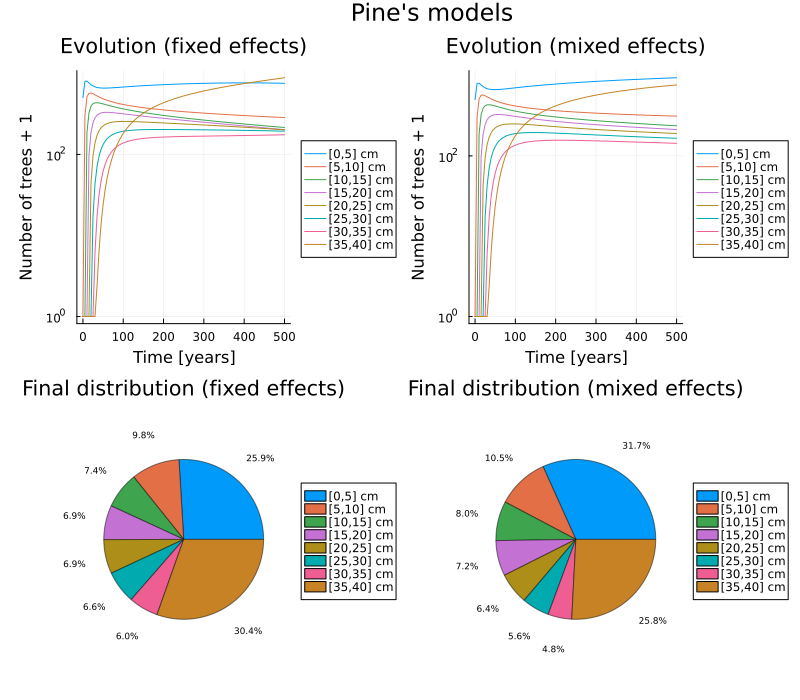

In [152]:
simulate_and_plot_BA("Pine", 100, X0)

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 1317.6530822824425
Final size of the forest (mixed effects): 1319.1078024098358


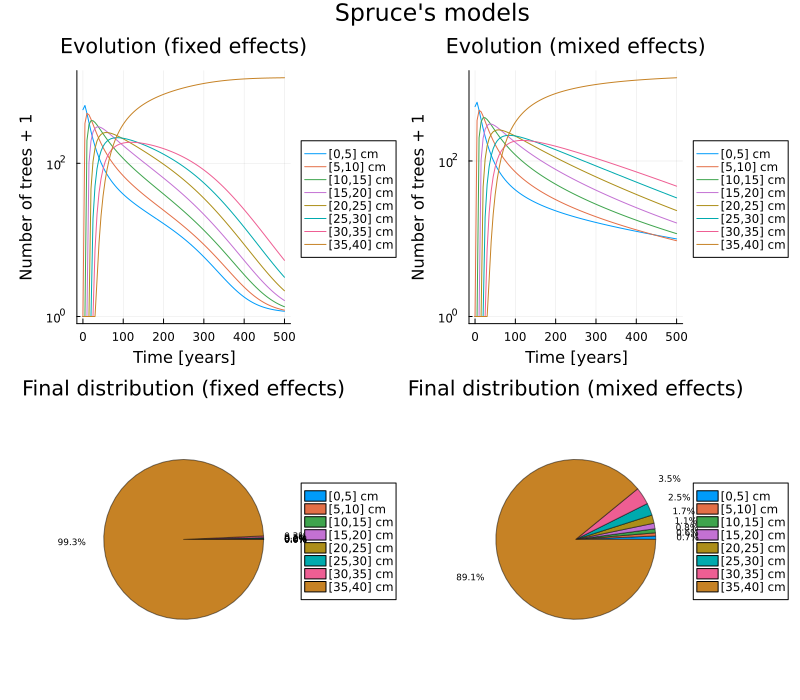

In [153]:
simulate_and_plot_BA("Spruce", 100, X0)

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 2807.4309736544947
Final size of the forest (mixed effects): 2910.7686308192533


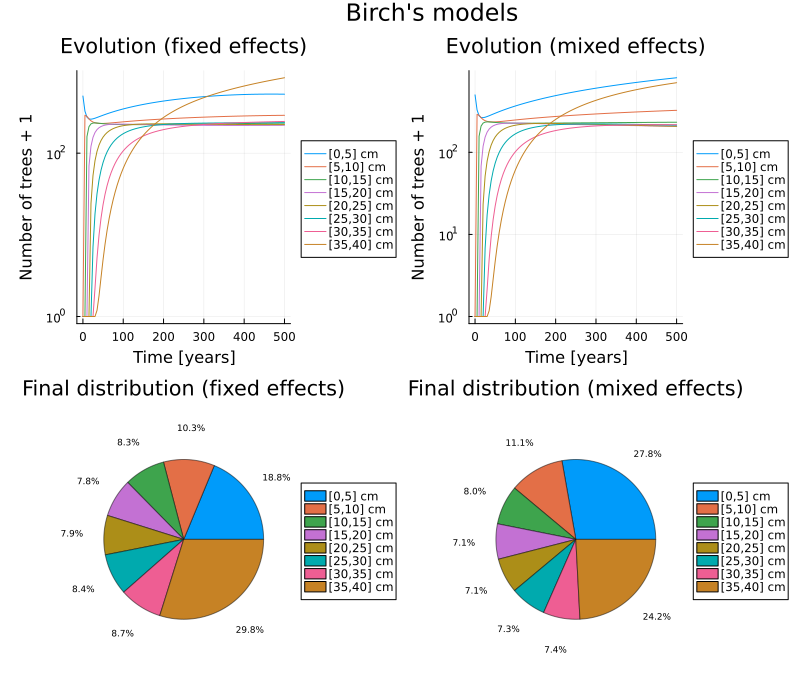

In [154]:
simulate_and_plot_BA("Birch", 100, X0)

Initial size of the forest: 500.0
Final size of the forest (fixed effects): 2807.4309736544947
Final size of the forest (mixed effects): 2910.7686308192533


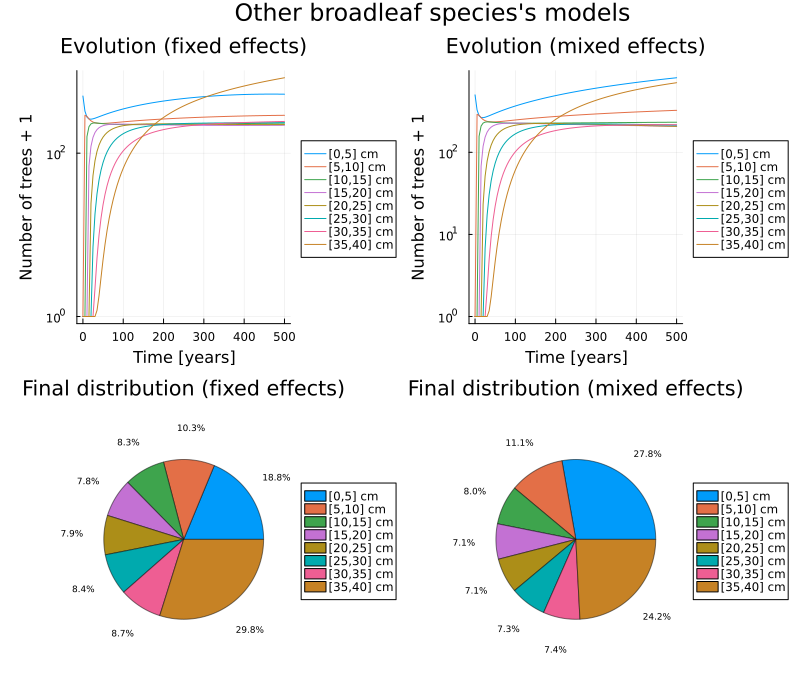

In [155]:
simulate_and_plot_BA("Other broadleaf species", 100, X0)

# **Biomass: Jenkins's model**

This section of work was inspired by a model of tree biomass done by Jenkins, Chojnacky, Heath and Birdsey. For more information, see Jenkins et al. (2003)

Their model proposes that the above-ground biomass (the dry weight in kg of organic matter) of a tree, as a function of diameter, is given by the following expression:
$$
bm(d) = exp(\beta_0 +  \beta_1\log d),
$$
with coefficients $\beta_0$ and $\beta_1$ to be determined.

After a massive compilation of models proposed up to that point, the authors generated pseudodata from each of them. They then determined the coefficients for different genera of tree species common in the United States using logarithmic regressions, obtaining quasi-quadratic functions as a function of diameter. These genera included *Picea*, *Pinus*, and a group of broadleaf species.

## **Implementation**

To use said biomass functions, the biomass of each diameter class was fixed as the biomass assigned to the average diameter of the class. As before, these values are stored on a Dictionary.

In [156]:
# Coefficients used for biomass
coefs_biomass_pine = [-2.5356, 2.4349]
coefs_biomass_spruce = [-2.0773, 2.3323]
coefs_biomass_broadleaf = [-1.9123, 2.3651]

"""
     biomass_fn(d:Float64, coefs:Vector{Float64})-> Float64

Returns bm(d), based on the coefficients.

# Arguments
- `d::Float64`: diameter of the tree the function bm is being applied to.
- `coefs::Vector{Float64}`: coefficients of the function bm.
"""
biomass_fn = (d, coefs) -> exp(sum(coefs.*[1, log(d)]))

"""
     biomass_eval(coefs:Vector{Float64})-> Vector{Float64}

Returns the biomass values assigned to each class based on the coefficents.

# Arguments
- `coefs::Vector{Float64}`: coefficients of the function bm.
"""
biomass_eval = coefs -> [biomass_fn(d, coefs) for d in avg_diams]

# Biomass values for each species.
biomass = Dict()
biomass["Pine"] = biomass_eval(coefs_biomass_pine)
biomass["Spruce"] = biomass_eval(coefs_biomass_spruce)
biomass["Birch"] = biomass_eval(coefs_biomass_broadleaf)
biomass["Other broadleaf species"] = biomass_eval(coefs_biomass_broadleaf);

To compare between the functions, they are plotted.

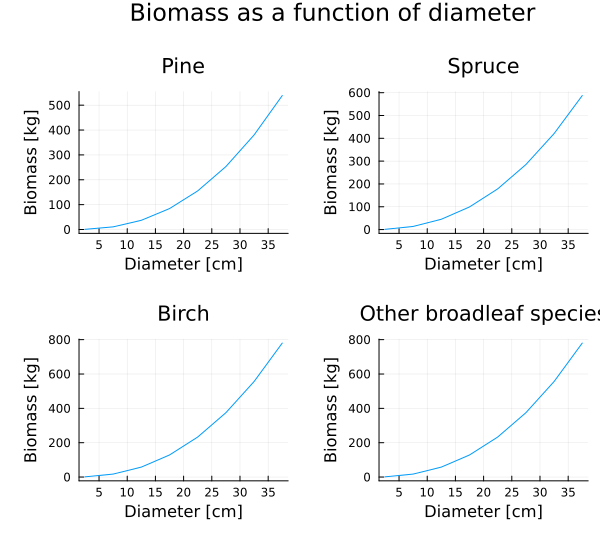

In [157]:
function plot_biomass(Species)
    p = plot(
    avg_diams,
    biomass[Species],
    legend=false,
    xaxis="Diameter [cm]", 
    yaxis="Biomass [kg]", 
    left_margin=5mm,
    bottom_margin=5mm, 
    title=Species
    )
    return p
end

p1 = plot_biomass("Pine")
p2 = plot_biomass("Spruce")
p3 = plot_biomass("Birch")
p4 = plot_biomass("Other broadleaf species")

plot(
    p1,p2,p3,p4,
    size=(600,550), 
    layout=(2,2), 
    plot_title="Biomass as a function of diameter",
    plot_titlevspan=0.1
    )

# **Optimization**

To finally implement the models on the $\texttt{SDDP.jl}$ library, first some initial pareters are set in place.

In [158]:
# initial conditions
x0 = [60 for i in 1:num_classes]
x1 = [200/2^i for i in 1:num_classes]
x2 = zeros(num_classes)
x2[1] = 600
x3 = [200*exp(-(i-4.5)^2) for i in 1:num_classes]

# discount factors
b0 = 0.975
b1 = 0.95
b2 = 0.9
b3 = 0.85;

We create a function that defines a model depending on the ingrowth function.

In [ ]:
"""
     dep_model(species:String, effect:String, ingrowth_fn:Function)->SDDP.PolicyGraph{Int64}

Returns a policy graph based on Pukkala's model under the assumption of a non-constant ingrowth function.

# Arguments
- `species::String`: species to be simulated.
- `effect::String`: model for the survival paremeters to be simulated.
- `ingrowth_fn::Function`: ingrowth function used in the model.
"""
function dep_model(species, effect, ingrowth_fn, X0, b, UB)
    # Cyclic graph consisting of one node with a probability of (1-b) of exiting the cycle 
    graph = SDDP.UnicyclicGraph(b; num_nodes = 1)
    model = SDDP.PolicyGraph(
        graph;
        sense = :Max,
        upper_bound = UB,
        # optimizer = Ipopt.Optimizer,
        optimizer = () -> Gurobi.Optimizer(GRB_ENV),
    ) do sp, t
        # variable: madera 
        @variable(sp, x[s = 1:num_classes] >=0, SDDP.State, initial_value = X0[s]) # state variables, multidimensional.
        @variable(sp, c[1:num_classes] >= 0) # control variables
        @variable(sp, BA >= 0) # basal area
        @variable(sp, TV >= 0) # Timber volume
        @variable(sp, u >= 0) # slack variable to maximize, forced to be approx. TV^(1-α)/(1-α) 
        @constraints(sp, begin
            [s = 2:num_classes], x[s].out == sum(diam[species][s,t]*((x[t].in - c[t])*surviv[species,effect][t]) for t in 1:num_classes) # balance equations
            sum(BAs[s] * x[s].out for s in 2:num_classes) == BA
            x[1].out == diam[species][1,1]*(x[1].in - c[1])*surviv[species, effect][1] + ingrowth_fn[species](BA)
            sum(biomass[species][s] * c[s] for s in 1:num_classes) == TV # timber volume
            [s = 1:ny], u <= as[s]*TV + bs[s] #forces u to be approx. TV^(1-α)/(1-α)
        end)
        @stageobjective(sp, u)
    end 
    return model
end

"""
     train(model:SDDP.PolicyGraph{Int64})->SDDP.PolicyGraph{Int64}

Returns a trained model.

# Arguments
- `model::SDDP.PolicyGraph{Int64}`: model to be trained.

"""
function train(model)
    SDDP.train(model, iteration_limit = n_train_iterations)
    return model
end

"""
     simulate(model:SDDP.PolicyGraph{Int64})->Tuple{Matrix{Float64}, Matrix{Float64}, Vector{Float64}}

Estimates both an upper bound and a confidence interval for the objective function through a 
series of simulations. Furthermore, it returns the evolution of the state vector, the control vector 
(chopped down trees) and the basal area of the longest simulation.

# Arguments
- `model::SDDP.PolicyGraph{Int64}`: model to be simulated.
"""
function simulate(model)
    # simulations = SDDP.simulate(model, 200, [:x, :u, :BA])
    simulations = SDDP.simulate(
        model, 1,
        [:x, :c, :u, :BA],
        sampling_scheme = SDDP.Historical([(1,0) for i in 1:70],),
        
    );
    Y = reduce(hcat, [[simulations[1][t][:x][s].in for t in 1:70] for s in 1: num_classes])
    C = reduce(hcat, [[simulations[1][t][:c][s] for t in 1:70] for s in 1: num_classes])
    U = [simulations[1][t][:u] for t in 1:70]
    BA = [simulations[1][t][:BA] for t in 1:70]
    # max_len, argmax_len = maximum(length.(simulations)), argmax(length.(simulations))
    # Y = reduce(hcat, [[simulations[argmax_len][t][:x][s].in for t in 1:max_len] for s in 1: num_classes])
    # C = reduce(hcat, [[simulations[argmax_len][t][:u][s] for t in 1:max_len] for s in 1: num_classes])
    # U = reduce(hcat, [simulations[argmax_len][t][:u] for t in 1:max_len])
    # BA = [simulations[argmax_len][t][:BA] for t in 1:max_len]
    objective_values = [
        sum(stage[:stage_objective] for stage in sim) for sim in simulations
    ]
    μ, ci = round.(SDDP.confidence_interval(objective_values, 1.96); digits = 2)
    upper_bound = SDDP.calculate_bound(model)
    println("Confidence interval: ", μ, " ± ", ci)
    println("Upper bound: ", round(upper_bound, digits = 2))
    return (Y, C, U, BA)
end

"""
     dep_model_all(species:String, effect:String, ingrowth_fn:Function)->Tuple{Matrix{Float64}, Matrix{Float64}, Vector{Float64}}

Builds a policy graph based on Pukkala's model under the assumption of non-fixed basal areas. After this, 
it trains the policy graph and estimates both an upper bound and a confidence interval
for the objective function through a series of simulations. Furthermore, it returns the evolution of the state vector,
the control vector (chopped down trees) and the basal area of the longest simulation.

# Arguments
- `species::String`: species to be simulated.
- `effect::String`: model for the survival paremeters to be simulated.
- `ingrowth_fn::Function`: ingrowth function used in the model.
"""
dep_model_all = (species, effect, ingrowth_fn) -> simulate(train(dep_model(species, effect, ingrowth_fn)));

Although it seems a bit unintuitive to have all these separete definitions, this will come in handy later.

In this implementation, the *forward passes* that select pivot points for the cuts are done by the non-linear model, while the *backward passes* that define the cuts are done by the linear model.

See the [Combining convex and non-convex models](https://sddp.dev/stable/tutorial/pglib_opf/#Combining-convex-and-non-convex-models) subsection on the $\texttt{SDDP.jl}$ documentation for a good explanation. 

In [ ]:
"""
     modified_fwd_model(species:String, effect:String)->SDDP.PolicyGraph{Int64}

Returns a non-linear model for a species and effect, with cuts directly obtained at 
forward passes of said model, while the backward passes come from a linear version 
of the model for said species and effect.

# Arguments
- `species::String`: species to be simulated.
- `effect::String`: model for the survival paremeters to be simulated.
"""
function modified_fwd_model(species, effect, X0, b, UB)
    model_aprox = dep_model(species, effect, ingrowth_BA_aprox, X0, b, UB)
    model = dep_model(species, effect, ingrowth_BA, X0, b, UB)
    SDDP.train(
        model_aprox;
        forward_pass = SDDP.AlternativeForwardPass(model),
        post_iteration_callback = SDDP.AlternativePostIterationCallback(model),
        iteration_limit = 30,
        dashboard=true
    )
    return model
end;

### **Pine**

In [161]:
model_pine_fixed00 = simulate(modified_fwd_model("Pine", "fixed", x0, b0, 13000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+04, 1e+04]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   4.228153e+03  1.359735e+04  3.109999e-01        78   1
         5   1.589206e+03  1.316641e+04  1.381000e+00       174   1
         7   1.745981e+04  1.218996e+04  3.358000e+00       273   1
         9   2.598784e+04  1.197870e+04  5.836000e+00       387   1
        10   3.122063e+04  1.187141e+04  9.041000e+00       493   1
        20   2.038775e+04  1.168475e+04  1.598300e+01       704   1
        25   2.964245e+03  1.163486e+04  2.135600e+01       850   1
        26   4.563050e+04  1.163486e+04  2.841800e+01       992   1
        30   6.451464e+03  1.163379e+04  3.187400e+01      1090   1

[ Info: Server on 127.0.0.1:8000 closing



-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 3.187400e+01
total solves   : 1090
best bound     :  1.163379e+04
simulation ci  :  8.977857e+03 ± 3.706458e+03
numeric issues : 0
-------------------------------------------------------------------

Confidence interval: 21654.89 ± NaN
Upper bound: 11648.98


In [162]:
model_pine_fixed01 = simulate(modified_fwd_model("Pine", "fixed", x0, b1, 6000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [6e+03, 6e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.508679e+03  6.597475e+03  1.270001e-01        21   1
         7   3.351540e+03  5.758623e+03  1.314000e+00        86   1
         8   2.041135e+04  5.522741e+03  3.317000e+00       165   1
        10   2.308864e+03  5.431537e+03  4.483000e+00       215   1
        12   1.059062e+04  5.341909e+03  5.539000e+00       258   1
        14   7.409810e+03  5.269985e+03  6.813000e+00       303   1
        16   1.986250e+04  5.264523e+03  8.826000e+00       376   1
        21   1.027105e+04  5.241518e+03  1.510600e+01       565   1
        30   3.682313e+03  5.241518e+03  2.002000e+01       691   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 2.002000e+01
total solves   : 691
best bound     :  5.241518e+03
simulation ci  :  5.660973e+03 ± 2.278029e+03
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20761.93 ± NaN
Upper bound: 5252.11


In [163]:
model_pine_fixed02 = simulate(modified_fwd_model("Pine", "fixed", x0, b2, 3000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [3e+03, 3e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   6.498976e+02  3.589918e+03  4.299998e-02         3   1
         5   7.490000e+02  2.733968e+03  1.110000e+00        53   1
         9   3.925269e+03  2.524153e+03  2.592000e+00        99   1
        14   1.202770e+03  2.481324e+03  3.729000e+00       133   1
        19   1.263750e+03  2.455668e+03  4.963000e+00       163   1
        21   3.374469e+03  2.453704e+03  6.109000e+00       194   1
        24   3.640672e+03  2.447227e+03  7.390000e+00       230   1
        28   4.711767e+03  2.437929e+03  9.218000e+00       273   1
        30   2.104550e+03  2.437175e+03  1.039300e+01       300   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.039300e+01
total solves   : 300
best bound     :  2.437175e+03
simulation ci  :  2.080553e+03 ± 5.160856e+02
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20727.21 ± NaN
Upper bound: 2443.41


In [164]:
model_pine_fixed03 = simulate(modified_fwd_model("Pine", "fixed", x0, b3, 2000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [2e+03, 2e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.031578e+03  2.596312e+03  9.099984e-02        11   1
         8   2.248104e+03  1.727755e+03  1.420000e+00        57   1
        12   5.292122e+03  1.653651e+03  2.938000e+00       100   1
        16   1.766802e+03  1.648519e+03  4.197000e+00       130   1
        22   1.114102e+03  1.636223e+03  5.319000e+00       158   1
        26   2.956265e+03  1.636171e+03  6.494000e+00       185   1
        30   2.306003e+03  1.633176e+03  7.857000e+00       217   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 7.857000e+00
total solves   : 217
best bound     :  1.633176e+03
simulation ci  :  1.495016e+03 ± 3.375959e+02
numeric issues : 0
-------------------------------------------------------------------

Confidence interval: 

[ Info: Server on 127.0.0.1:8000 closing


20473.54 ± NaN
Upper bound: 1637.31


In [165]:
model_pine_fixed10 = simulate(modified_fwd_model("Pine", "fixed", x1, b0, 13000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+04, 1e+04]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.389620e+03  1.313470e+04  1.090000e-01        28   1
         4   8.562383e+03  1.169759e+04  1.620000e+00       175   1
         5   1.753693e+04  1.141578e+04  3.150000e+00       267   1
         7   6.818704e+03  1.090868e+04  4.151000e+00       321   1
         9   3.434543e+04  1.073241e+04  6.639000e+00       453   1
        12   1.184549e+04  1.063933e+04  7.778000e+00       506   1
        19   3.548875e+03  1.043114e+04  1.288000e+01       725   1
        26   2.439290e+04  1.035786e+04  1.876400e+01       940   1
        27   3.084876e+04  1.035786e+04  2.377400e+01      1041   1
        29   2.477966e+04  1.035671e+04  2.881800e+01      1162   1
        30   9.915852e+03  1.035671e+04  3.014700e+01      1201   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 3.014700e+01
total solves   : 1201
best bound     :  1.035671e+04
simulation ci  :  9.116775e+03 ± 3.605507e+03
numeric issues : 0
---

[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20728.06 ± NaN
Upper bound: 10509.82


In [166]:
model_pine_fixed11 = simulate(modified_fwd_model("Pine", "fixed", x1, b1, 6000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [6e+03, 6e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   2.296111e+03  6.104905e+03  1.680000e-01        47   1
         5   4.472115e+02  4.536595e+03  1.271000e+00       106   1
        10   7.255000e+02  4.253983e+03  2.374000e+00       159   1
        13   7.835958e+03  4.215442e+03  3.501000e+00       207   1
        17   2.990000e+02  4.121952e+03  4.607000e+00       254   1
        19   4.857206e+03  4.093870e+03  6.151000e+00       310   1
        21   1.734687e+04  4.081477e+03  8.833000e+00       396   1
        27   1.340770e+04  4.074727e+03  1.418400e+01       545   1
        30   1.754940e+04  4.074727e+03  1.798700e+01       643   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.798700e+01
total solves   : 643
best bound     :  4.074727e+03
simulation ci  : 

[ Info: Server on 127.0.0.1:8000 closing


 4.133700e+03 ± 1.922126e+03
numeric issues : 0
-------------------------------------------------------------------

Confidence interval: 19779.2 ± NaN
Upper bound: 4186.47


In [167]:
model_pine_fixed12 = simulate(modified_fwd_model("Pine", "fixed", x1, b2, 3000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [3e+03, 3e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.968683e+02  3.098874e+03  3.199983e-02         3   1
         6   6.158862e+03  1.505987e+03  1.562000e+00        77   1
        10   2.651084e+03  1.489318e+03  2.804000e+00       129   1
        13   5.352416e+02  1.469614e+03  3.905000e+00       173   1
        17   2.489659e+02  1.469614e+03  4.917000e+00       207   1
        22   4.237407e+02  1.469614e+03  6.110000e+00       243   1
        25   9.354913e+03  1.469614e+03  7.897000e+00       294   1
        27   7.839981e+03  1.464897e+03  9.209000e+00       330   1
        30   5.345495e+02  1.457726e+03  9.747000e+00       347   1
-------------------------------------------------------------------

[ Info: Server on 127.0.0.1:8000 closing



status         : iteration_limit
total time (s) : 9.747000e+00
total solves   : 347
best bound     :  1.457726e+03
simulation ci  :  1.752336e+03 ± 8.271573e+02
numeric issues : 0
-------------------------------------------------------------------

Confidence interval: 19528.65 ± NaN
Upper bound: 1524.18


In [168]:
model_pine_fixed13 = simulate(modified_fwd_model("Pine", "fixed", x1, b3, 1000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+03, 1e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   6.262589e+02  1.129415e+03  6.800008e-02        12   1
         8   6.222123e+02  7.735744e+02  1.151000e+00        83   1
        16   1.676388e+03  7.679547e+02  2.271000e+00       135   1
        23   2.040361e+03  7.673130e+02  3.435000e+00       187   1
        28   2.397523e+03  7.673130e+02  4.485000e+00       236   1
        30   2.661727e+02  7.673130e+02  5.056000e+00       261   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 5.056000e+00
total solves   : 261
best bound     :  7.673130e+02
simulation ci  :  8.839929e+02 ± 3.001061e+02
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 12040.13 ± NaN
Upper bound: 804.62


In [169]:
model_pine_fixed20 = simulate(modified_fwd_model("Pine", "fixed", x2, b0, 13000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+04, 1e+04]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.616517e+03  1.300486e+04  1.310000e-01        35   1
         4   6.795550e+03  1.140372e+04  1.546000e+00       172   1
         7   4.691255e+03  1.073102e+04  2.643000e+00       227   1
         9   1.807345e+04  1.053394e+04  4.857000e+00       313   1
        13   2.909058e+04  1.042978e+04  9.624000e+00       448   1
        19   1.387930e+04  1.039400e+04  1.534800e+01       648   1
        23   2.481305e+04  1.037068e+04  2.207900e+01       864   1
        25   2.076053e+04  1.037068e+04  3.063600e+01      1054   1
        28   2.008282e+04  1.037068e+04  3.626600e+01      1210   1
        30   1.337000e+03  1.037068e+04  3.664100e+01      1230   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 3.664100e+01
total solves   : 1230
best bound     :  1.037068e+04
simulation ci  :  9.806418e+03 ± 3.900649e+03
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20759.88 ± NaN
Upper bound: 10543.18


In [170]:
model_pine_fixed21 = simulate(modified_fwd_model("Pine", "fixed", x2, b1, 6000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [6e+03, 6e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   1.187126e+03  6.009010e+03  8.100009e-02        26   1
         4   1.597138e+04  4.777771e+03  2.043000e+00       172   1
         7   8.953905e+03  4.395415e+03  3.457000e+00       248   1
        14   4.503246e+03  4.107671e+03  4.856000e+00       332   1
        15   2.280354e+04  4.059119e+03  6.704000e+00       415   1
        16   4.024092e+04  4.059119e+03  9.826000e+00       553   1
        30   2.262327e+02  4.038882e+03  1.333700e+01       720   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.333700e+01
total solves   : 720
best bound     :  4.038882e+03
simulation ci  :  4.385913e+03 ± 3.021325e+03
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 19703.82 ± NaN
Upper bound: 4161.75


In [171]:
model_pine_fixed22 = simulate(modified_fwd_model("Pine", "fixed", x2, b2, 3000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [3e+03, 3e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   8.531558e+02  2.945303e+03  5.500007e-02        19   1
        10   1.085997e+03  1.540610e+03  1.113000e+00        93   1
        15   2.587166e+03  1.384215e+03  2.361000e+00       158   1
        23   4.450000e+01  1.384215e+03  3.377000e+00       219   1
        30   4.200000e+01  1.374724e+03  4.322000e+00       274   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 4.322000e+00
total solves   : 274
best bound     :  1.374724e+03
simulation ci  :  1.003599e+03 ± 4.889459e+02
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 19925.07 ± NaN
Upper bound: 1452.36


In [172]:
model_pine_fixed23 = simulate(modified_fwd_model("Pine", "fixed", x2, b3, 1000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+03, 1e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   2.329249e+02  9.485989e+02  2.799988e-02         6   1
        16   3.347060e+03  6.635094e+02  1.354000e+00       112   1
        24   2.819390e+03  6.635093e+02  2.532000e+00       185   1
        30   3.435449e+02  6.635093e+02  3.035000e+00       221   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 3.035000e+00
total solves   : 221
best bound     :  6.635093e+02
simulation ci  :  6.441931e+02 ± 3.272439e+02
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 11926.29 ± NaN
Upper bound: 697.47


In [173]:
model_pine_fixed30 = simulate(modified_fwd_model("Pine", "fixed", x3, b0, 13000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [1e+04, 1e+04]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   3.470981e+03  1.341203e+04  2.539999e-01        66   1
         3   8.324146e+02  1.332113e+04  1.278000e+00       193   1
         5   1.836388e+04  1.247728e+04  3.113000e+00       284   1
         7   1.192948e+04  1.172928e+04  4.500000e+00       350   1
         9   3.169825e+04  1.140772e+04  8.183000e+00       492   1
        11   1.102636e+04  1.133133e+04  9.932000e+00       546   1
        13   3.715364e+04  1.122758e+04  1.694400e+01       698   1
        19   1.843776e+04  1.115687e+04  2.314900e+01       872   1
        24   4.144179e+04  1.115232e+04  3.169400e+01      1063   1
        29   2.962678e+04  1.115168e+04  3.945100e+01      1222   1
        30   3.023500e+03  1.115168e+04  4.003400e+01      1239   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 4.003400e+01
total solves   : 1239
best bound     :  1.115168e+04
simulation ci  :  9.636565e+03 ± 4.088676e+03
numeric issues : 0
---

[ Info: Server on 127.0.0.1:8000 closing


21184.61 ± NaN
Upper bound: 11182.66


In [174]:
model_pine_fixed31 = simulate(modified_fwd_model("Pine", "fixed", x3, b1, 6000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [6e+03, 6e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   8.469271e+02  6.412242e+03  9.999990e-02        11   1
         5   5.273213e+03  5.600438e+03  1.227000e+00        70   1
         7   4.727804e+03  5.046174e+03  2.413000e+00       133   1
         9   1.360451e+04  4.937975e+03  4.133000e+00       193   1
        12   1.982875e+03  4.867069e+03  5.194000e+00       224   1
        14   2.342655e+03  4.845332e+03  6.591000e+00       271   1
        17   1.001427e+04  4.828614e+03  8.691000e+00       332   1
        19   6.665168e+03  4.829881e+03  9.862000e+00       365   1
        28   3.804492e+03  4.799411e+03  1.556300e+01       509   1
        30   1.509621e+02  4.799411e+03  1.574800e+01       514   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.574800e+01
total solves   : 514
best bound     :  4.799411e+03
simulation ci  :  3.515709e+03 ± 1.241412e+03
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20258.2 ± NaN
Upper bound: 4823.0


In [175]:
model_pine_fixed32 = simulate(modified_fwd_model("Pine", "fixed", x3, b2, 3000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [3e+03, 3e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   5.129566e+02  3.412711e+03  6.900001e-02         4   1
         7   1.550250e+03  2.223482e+03  1.096000e+00        51   1
        11   3.586278e+03  2.133290e+03  2.780000e+00        93   1
        15   1.497668e+03  2.084429e+03  3.800000e+00       117   1
        17   1.277433e+04  2.072801e+03  5.957000e+00       180   1
        19   1.341293e+03  2.059059e+03  7.258000e+00       211   1
        21   1.886820e+03  2.055649e+03  8.354000e+00       239   1
        25   2.974498e+03  2.055573e+03  9.941000e+00       278   1
        30   3.723236e+03  2.054421e+03  1.208500e+01       326   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.208500e+01
total solves   : 326
best bound     :  2.054421e+03
simulation ci  :  2.006647e+03 ± 8.267920e+02
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 20384.87 ± NaN
Upper bound: 2069.0


In [176]:
model_pine_fixed33 = simulate(modified_fwd_model("Pine", "fixed", x3, b3, 2000));

-------------------------------------------------------------------
         SDDP.jl (c) Oscar Dowson and contributors, 2017-25
-------------------------------------------------------------------
problem
  nodes           : 1
  state variables : 8
  scenarios       : Inf
  existing cuts   : false
options
  solver          : serial mode
  risk measure    : SDDP.Expectation()
  sampling scheme : SDDP.InSampleMonteCarlo
subproblem structure
  VariableRef                             : [28, 28]
  AffExpr in MOI.EqualTo{Float64}         : [10, 10]
  AffExpr in MOI.LessThan{Float64}        : [200, 200]
  VariableRef in MOI.GreaterThan{Float64} : [19, 19]
  VariableRef in MOI.LessThan{Float64}    : [1, 1]
numerical stability report
  matrix range     [4e-03, 5e+02]
  objective range  [1e+00, 1e+00]
  bounds range     [2e+03, 2e+03]
  rhs range        [5e-01, 3e+02]
-------------------------------------------------------------------
 iteration    simulation      bound        time (s)     solves

[ Info: Listening on: 127.0.0.1:8000, thread id: 1


         1   8.469271e+02  2.410376e+03  1.010001e-01        11   1
         5   1.334992e+04  1.491173e+03  1.731000e+00        96   1
        10   2.843769e+03  1.361673e+03  3.073000e+00       136   1
        15   4.345000e+02  1.306229e+03  4.137000e+00       162   1
        18   1.856055e+03  1.304710e+03  5.356000e+00       188   1
        20   3.184029e+03  1.303851e+03  6.774000e+00       223   1
        23   2.212452e+02  1.302474e+03  7.808000e+00       252   1
        30   1.170735e+03  1.300078e+03  1.137200e+01       331   1
-------------------------------------------------------------------
status         : iteration_limit
total time (s) : 1.137200e+01
total solves   : 331
best bound     :  1.300078e+03
simulation ci  :  1.997348e+03 ± 1.055854e+03
numeric issues : 0
-------------------------------------------------------------------



[ Info: Server on 127.0.0.1:8000 closing


Confidence interval: 18732.56 ± NaN
Upper bound: 1309.64


In [209]:
function plot_trajectories(model, species)
    Y, C, U, BA = model
    print("Initial size of the forest: ");println(sum(Y[1,:]))
    print("Final size of the forest (fixed effects): ");println(sum(Y[end,:]))
    print("Maximum basal area (fixed effects): ");println(maximum(BA))
    pf1 = plot(
        0:5:69*5,
        Y .+ 1, 
        yaxis=:log10, 
        label = legends, 
        left_margin=5mm, 
        bottom_margin=5mm,
        legend = :outerright,
        title = "Diameter classes (fixed effects)", 
        xlabel = "Time [Years]", 
        ylabel = "Number of trees + 1"
        )
    pf2 = create_pie(
        Y[end,:], 
        "fixed"
        )
    pf3 = plot(
        0:5:69*5,
        BA, 
        label="Basal area",
        legend = :outerright, 
        title="Basal area (fixed effects)", 
        xlabel="Time [Years]", 
        ylabel = "Total area [m^2/ha]"
        )
    pf4 = plot(
        0:5:69*5,
        C .+ 1, 
        yaxis=:log10, 
        label = legends,
        legend = :outerright, 
        title = "Optimal cutting policy (fixed effects)", 
        left_margin=5mm,
        xlabel = "Time [Years]", 
        ylabel = "Number of trees + 1"
        )
    pf5 = plot(
        0:5:69*5,
        U, 
        label="Gain",
        legend = :outerright, 
        title="Gain function (fixed effects)", 
        xlabel="Time [Years]", 
        ylabel = "money"
        )
    plot(
        pf1, pf2, pf3, pf4, pf5,
        layout=(2,3), 
        size=(1350,800), 
        plot_title=species*"'s model"
        )
end;

Initial size of the forest: 480.0
Final size of the forest (fixed effects): 1727.0422483539928
Maximum basal area (fixed effects): 48.96513788001351


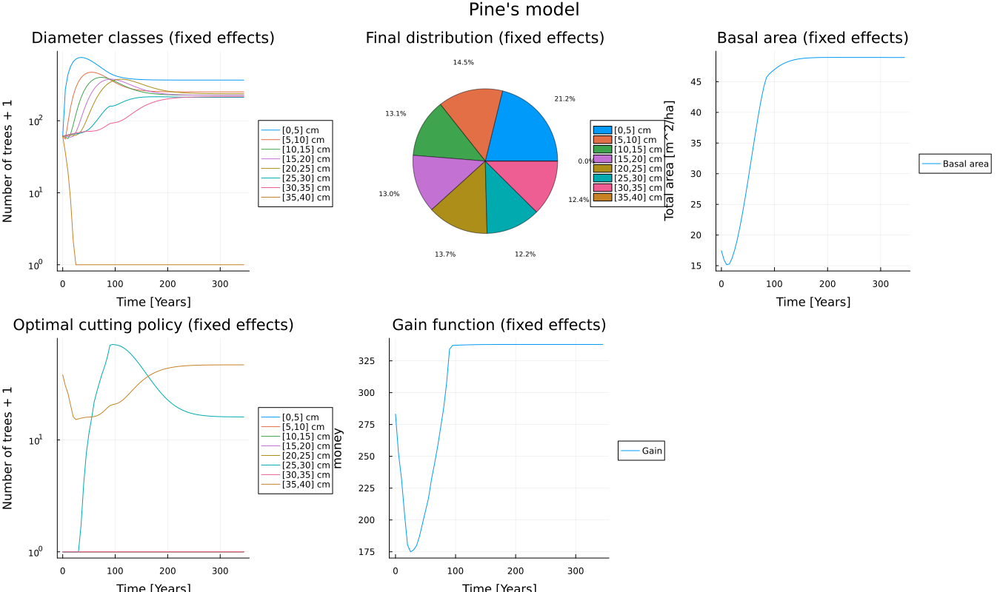

In [236]:
plot_trajectories(model_pine_fixed00, "Pine")


Initial size of the forest: 199.21875
Final size of the forest (fixed effects): 1727.0279799642014
Maximum basal area (fixed effects): 48.97464291803113


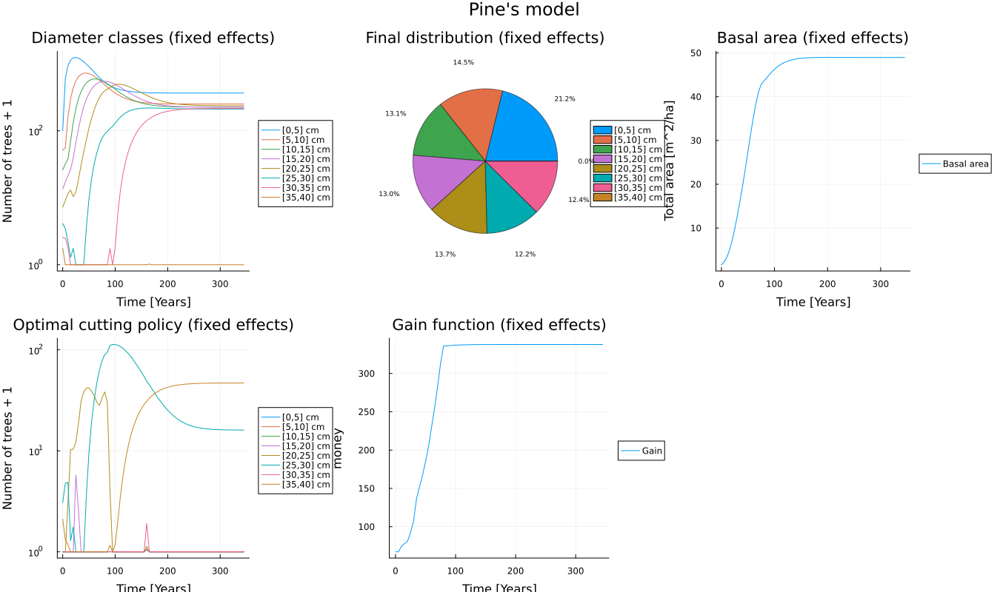

In [237]:
plot_trajectories(model_pine_fixed10, "Pine")


Initial size of the forest: 600.0
Final size of the forest (fixed effects): 1727.0255461783593
Maximum basal area (fixed effects): 48.97564682377925


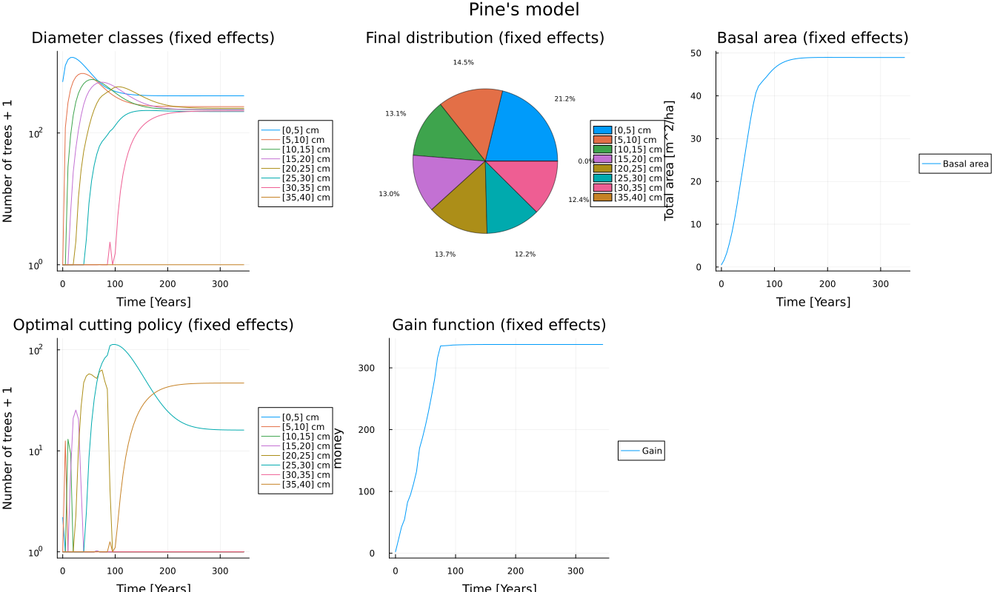

In [238]:
plot_trajectories(model_pine_fixed20, "Pine")


Initial size of the forest: 354.45409875475565
Final size of the forest (fixed effects): 1726.511090746102
Maximum basal area (fixed effects): 48.965373125972974


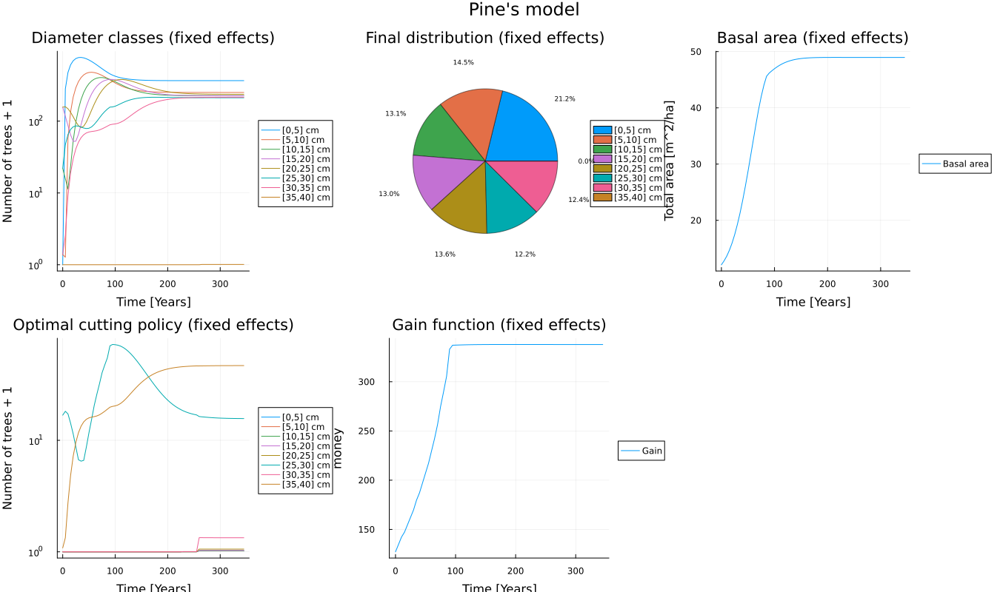

In [239]:
plot_trajectories(model_pine_fixed30, "Pine")


Initial size of the forest: 480.0
Final size of the forest (fixed effects): 1851.0624048410693
Maximum basal area (fixed effects): 38.97496805148221


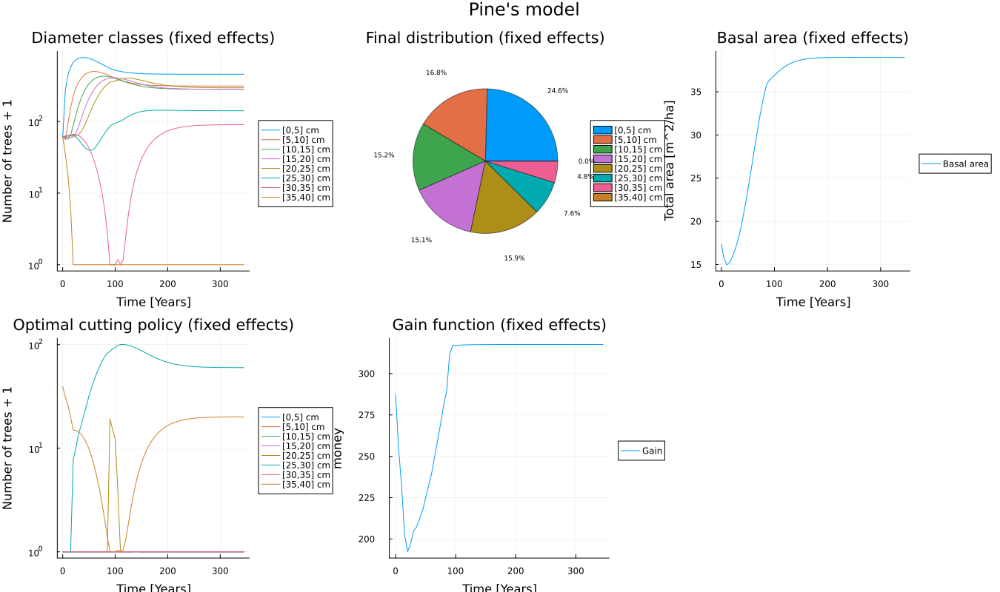

In [240]:
plot_trajectories(model_pine_fixed01, "Pine")


Initial size of the forest: 199.21875
Final size of the forest (fixed effects): 1850.923139822541
Maximum basal area (fixed effects): 38.984311566407015


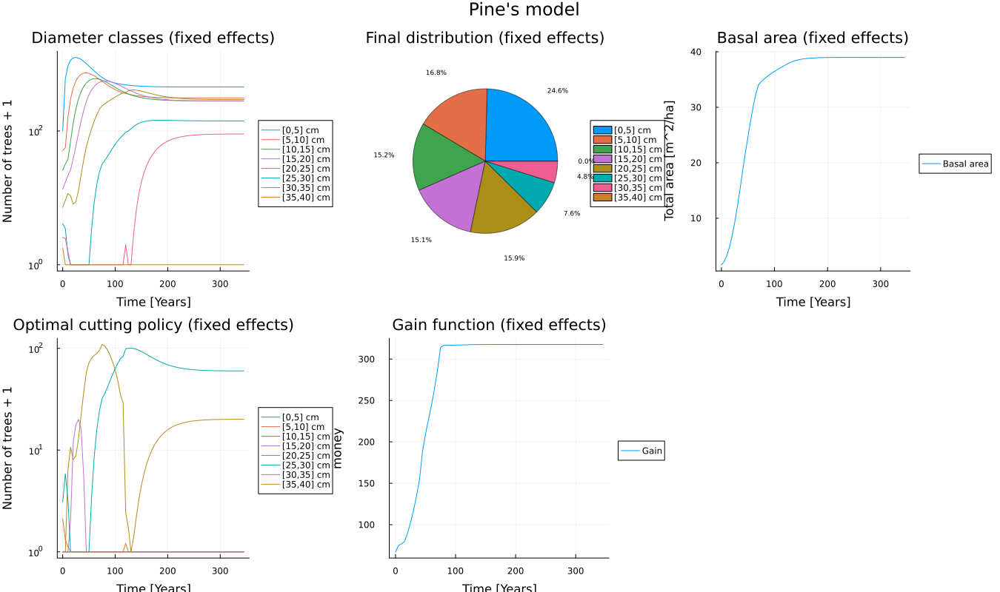

In [241]:
plot_trajectories(model_pine_fixed11, "Pine")


Initial size of the forest: 600.0
Final size of the forest (fixed effects): 1869.7279554804418
Maximum basal area (fixed effects): 37.9223361969454


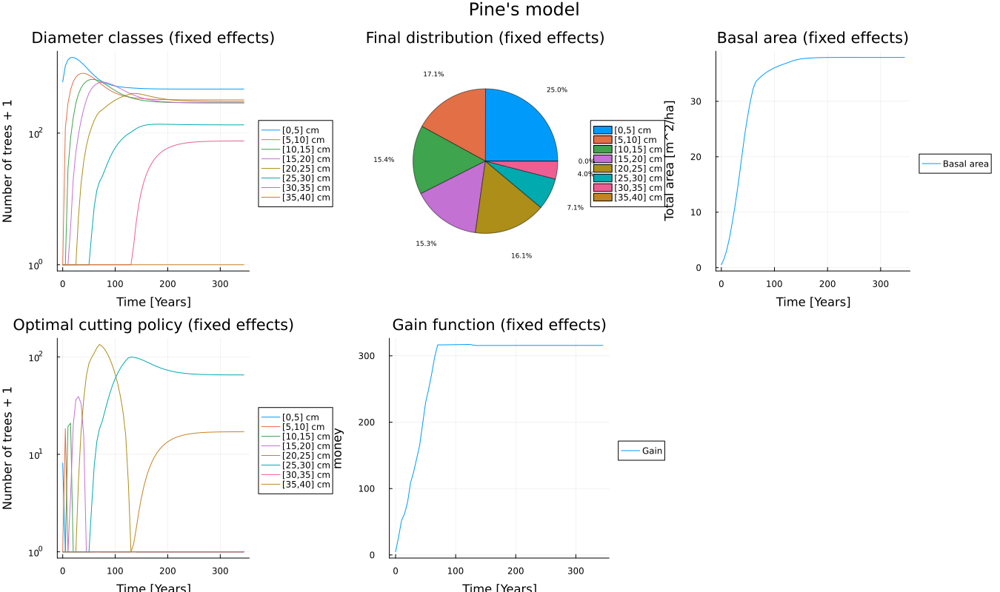

In [242]:
plot_trajectories(model_pine_fixed21, "Pine")


Initial size of the forest: 354.45409875475565
Final size of the forest (fixed effects): 1861.971765989222
Maximum basal area (fixed effects): 38.34999586840026


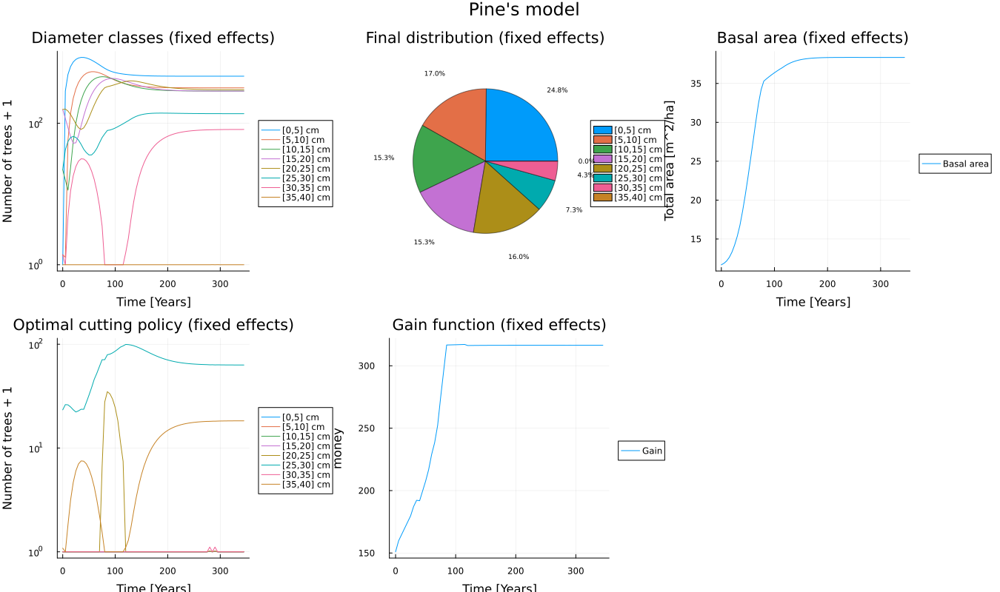

In [243]:
plot_trajectories(model_pine_fixed31, "Pine")


Initial size of the forest: 480.0
Final size of the forest (fixed effects): 1848.22206678691
Maximum basal area (fixed effects): 40.40074556486845


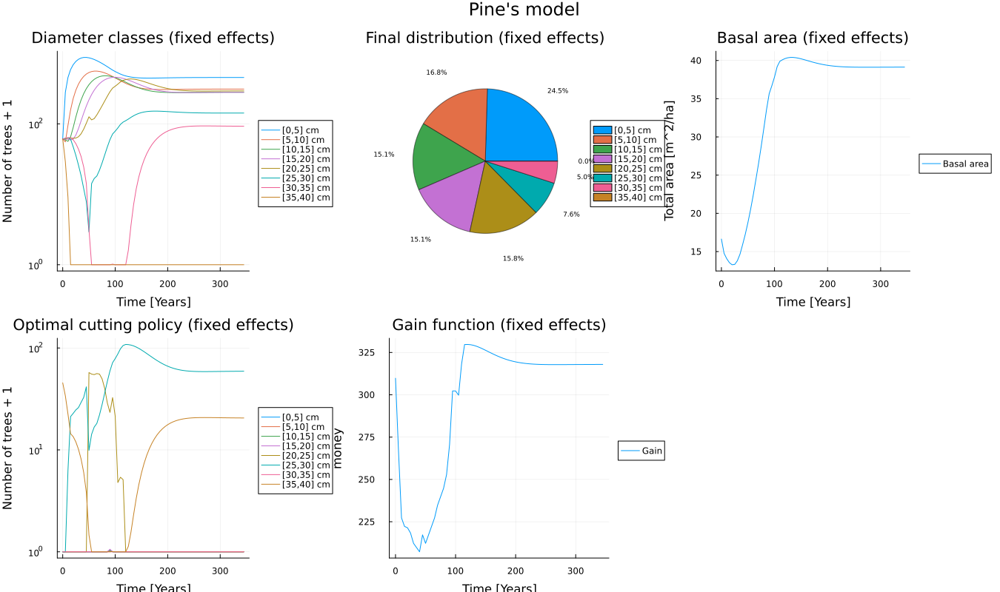

In [244]:
plot_trajectories(model_pine_fixed02, "Pine")


Initial size of the forest: 199.21875
Final size of the forest (fixed effects): 1957.783915807816
Maximum basal area (fixed effects): 43.11807159369735


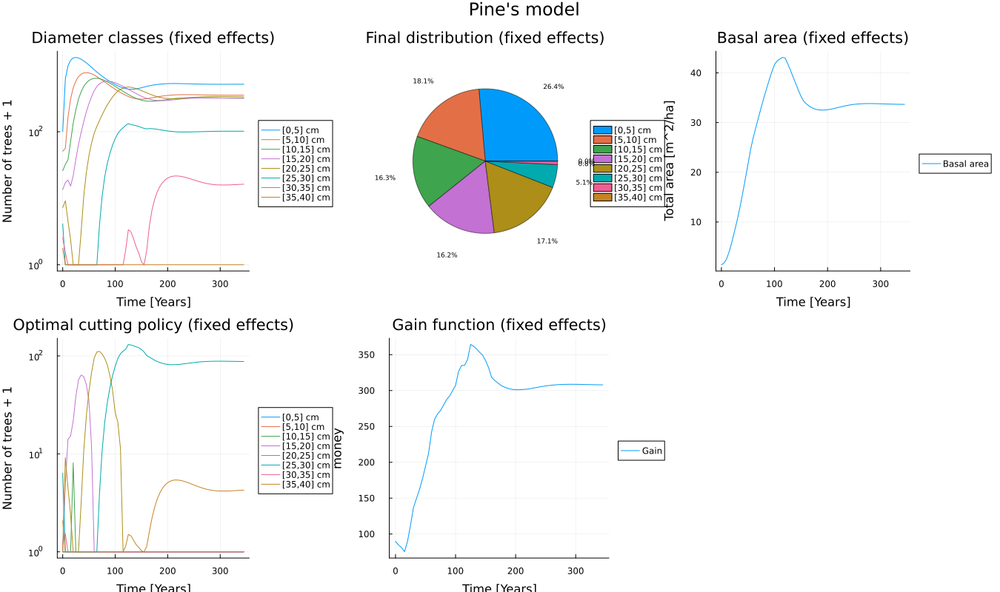

In [245]:
plot_trajectories(model_pine_fixed12, "Pine")


Initial size of the forest: 600.0
Final size of the forest (fixed effects): 1839.5564496867873
Maximum basal area (fixed effects): 41.240491609596


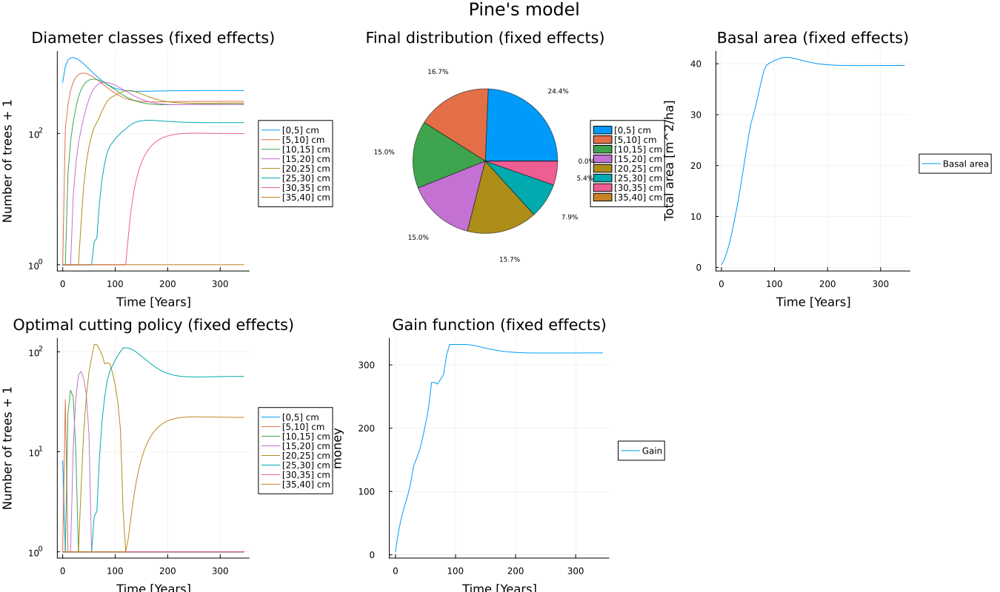

In [246]:
plot_trajectories(model_pine_fixed22, "Pine")


Initial size of the forest: 354.45409875475565
Final size of the forest (fixed effects): 1823.2584649837916
Maximum basal area (fixed effects): 41.86463937066013


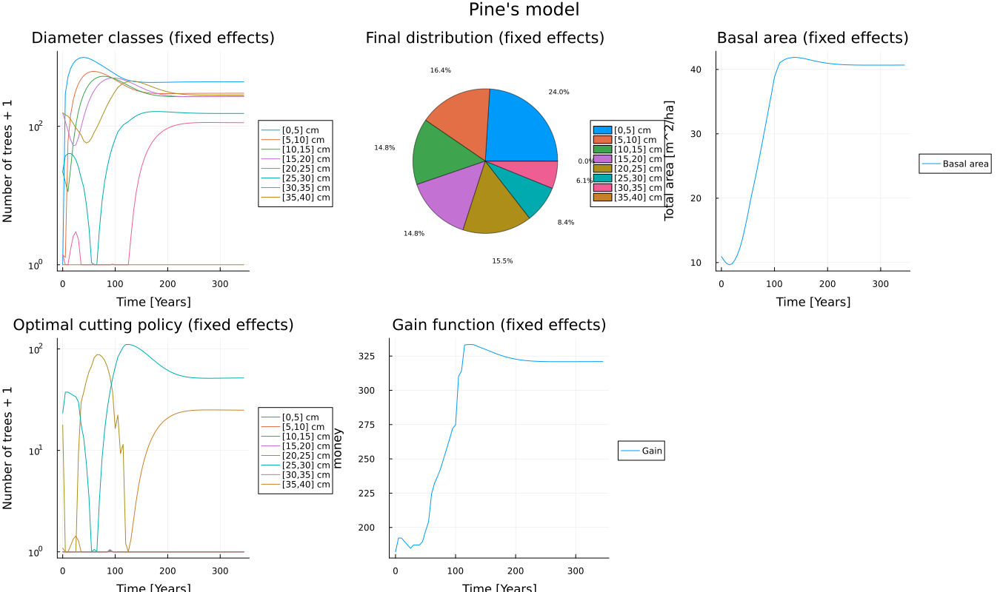

In [247]:
plot_trajectories(model_pine_fixed32, "Pine")


Initial size of the forest: 480.0
Final size of the forest (fixed effects): 1851.3196177914049
Maximum basal area (fixed effects): 39.371617341089745


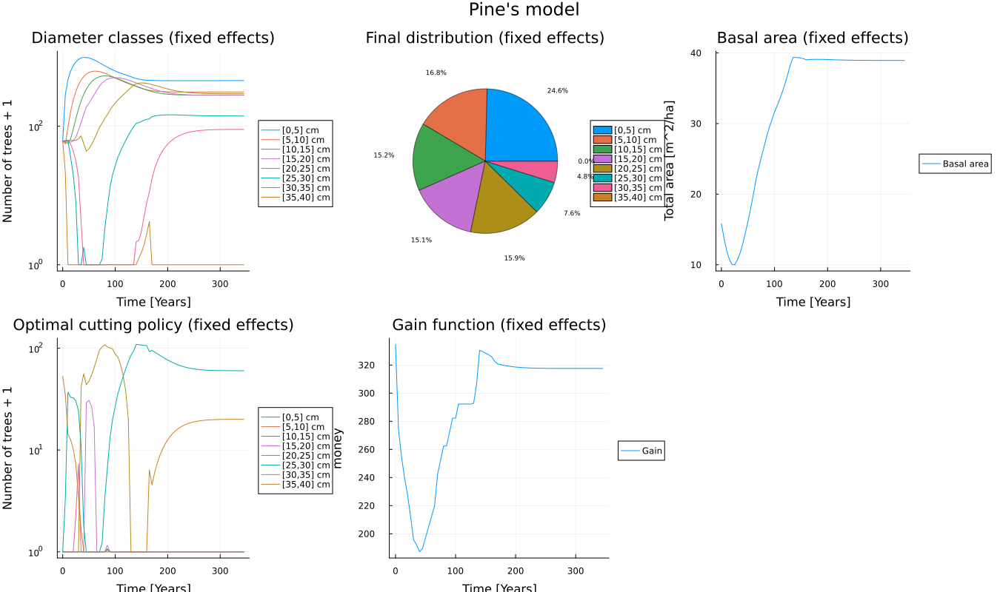

In [248]:
plot_trajectories(model_pine_fixed03, "Pine")


Initial size of the forest: 199.21875
Final size of the forest (fixed effects): 2359.8128080287715
Maximum basal area (fixed effects): 5.827680787897145


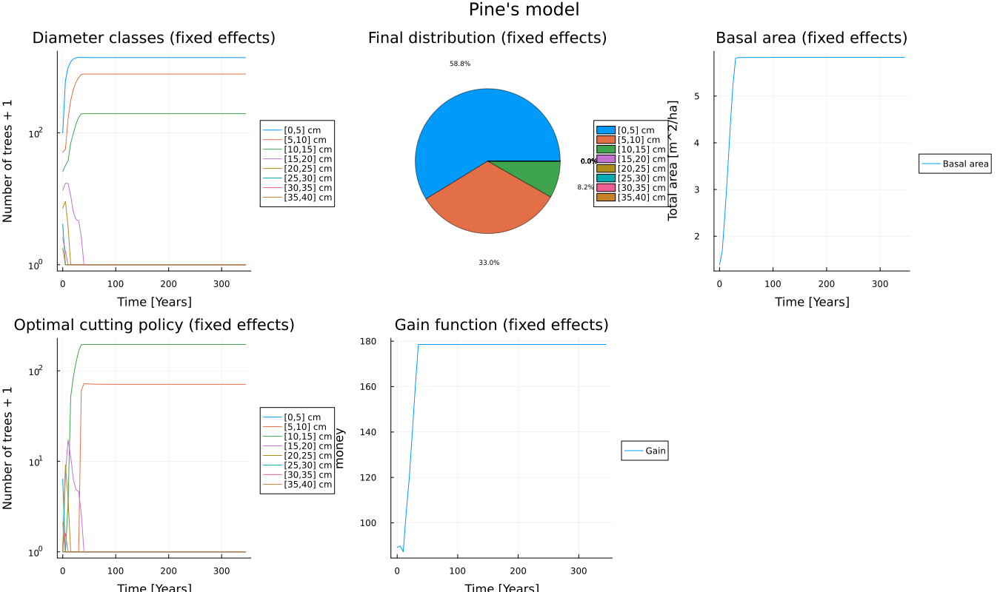

In [249]:
plot_trajectories(model_pine_fixed13, "Pine")


Initial size of the forest: 600.0
Final size of the forest (fixed effects): 2359.81280877267
Maximum basal area (fixed effects): 5.8276807877953125


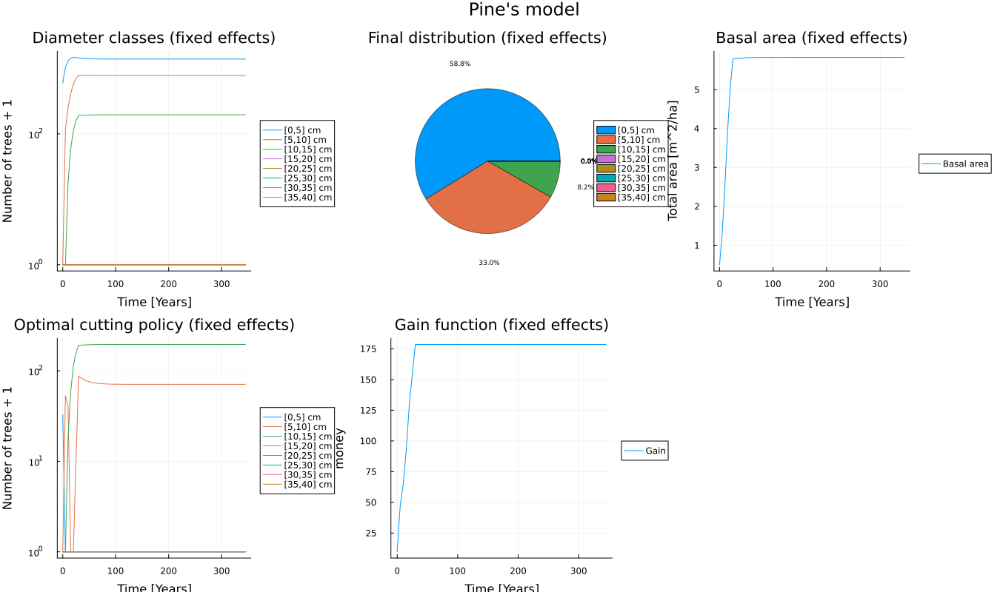

In [250]:
plot_trajectories(model_pine_fixed23, "Pine")


Initial size of the forest: 354.45409875475565
Final size of the forest (fixed effects): 2097.2212002908013
Maximum basal area (fixed effects): 29.66764220023624


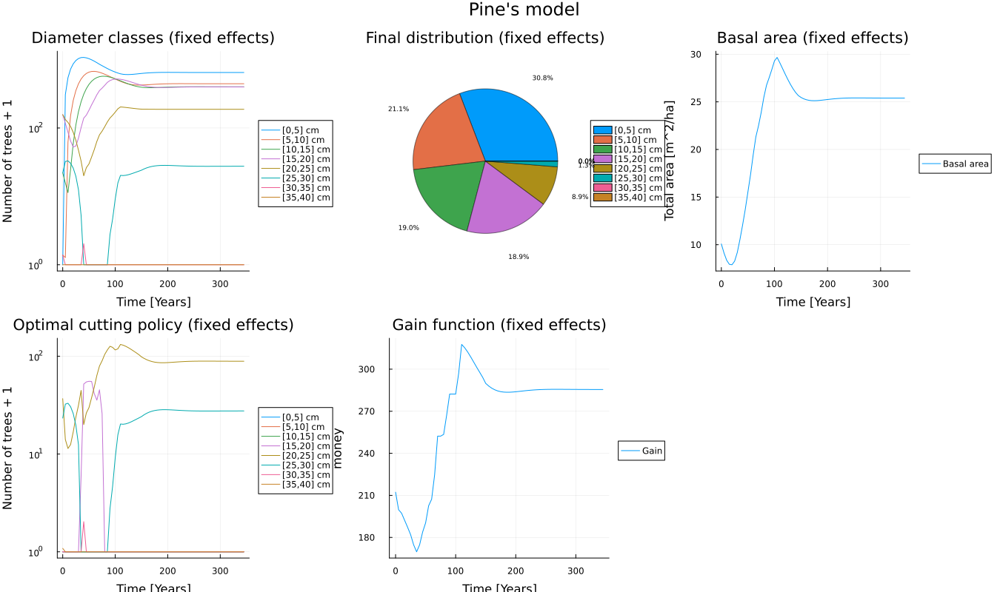

In [251]:
plot_trajectories(model_pine_fixed33, "Pine")

### **Spruce**

In [252]:
# model_spruce_fixed4 = simulate(modified_fwd_model("Spruce", "fixed"));

In [253]:
# model_spruce_mixed4 = simulate(modified_fwd_model("Spruce", "mixed"));

In [254]:
# plot_trajectories(model_spruce_fixed4, model_spruce_mixed4, "Spruce")

### **Birch**

In [255]:
# model_birch_fixed4 = simulate(modified_fwd_model("Birch", "fixed"));

In [256]:
# model_birch_mixed4 = simulate(modified_fwd_model("Birch", "mixed"));

In [257]:
# plot_trajectories(model_birch_fixed4, model_birch_mixed4, "Birch")

### **Broadleaf**

In [258]:
# model_broadleaf_fixed4 = simulate(modified_fwd_model("Other broadleaf species", "fixed"));

In [259]:
# model_broadleaf_mixed4 = simulate(modified_fwd_model("Other broadleaf species", "mixed"));

In [260]:
# plot_trajectories(model_broadleaf_fixed4, model_broadleaf_mixed4, "Broadleaf")